Referências:
- https://learnopencv.com/getting-started-with-opencv/
- AQUINO, Aurélio Freire. Apostila de Visão Computacional Industrial: OpenCV com Python.Manaus: Fit Instituto de Tecnologia, 2023.
- https://scikit-image.org/skimage-tutorials/lectures/00_images_are_arrays.html 

# **OpenCV**

In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

## **Leia, exiba e escreva uma imagem**

### **Lendo uma imagem**

Para a leitura de uma imagem, usa-se **imread(filename, flags)**. O primeiro parâmetro corresponde ao caminho até a imagem e o segundo parâmetro permite especificar como a imagem deve ser representada. É importante lembrar que o OpenCV lê as imagens coloridas no formato BGR.

In [ ]:
image1= "image/flower.jpg"
img_colorida=cv2.imread(image1, cv2.IMREAD_COLOR) #retorna um numpy ndarray
img_cinza=cv2.imread(image1, cv2.IMREAD_GRAYSCALE)

In [70]:
img_colorida.shape

(682, 1024, 3)

In [4]:
# 2. Isolar cada canal individualmente (gera matrizes 2D)
canal_0 = img_colorida[:, :, 0] # Primeiro canal
canal_1 = img_colorida[:, :, 1] # Segundo canal
canal_2 = img_colorida[:, :, 2] # Terceiro canal

print(canal_0)

[[67 67 68 ... 46 46 46]
 [68 68 69 ... 46 46 46]
 [69 70 70 ... 46 46 46]
 ...
 [81 81 80 ... 18 18 18]
 [84 81 78 ... 18 18 18]
 [84 81 78 ... 18 18 18]]


In [5]:
print(img_colorida[0,0]) #acessando o canal do pixel coord. 0,0

[ 67 142 228]


### **Exibindo uma imagem**

No OpenCV, exibimos uma imagem usando o **imshow()**;

O **imshow()** é projetado para ser usado juntamente com o **waitKey()** e **destroyAllWindows() / destroyWindow()** funções. 

In [6]:
#cv2.imshow('Imagem Colorida', img_colorida)
#cv2.imshow('Imagem Cinza', img_cinza)

#key = cv2.waitKey(0)
#if (key == ord('q')):
#    cv2.destroyAllWindows()

In [7]:
teste = cv2.cvtColor(cv2.imread('image/andromeda.jpg'), cv2.COLOR_BGR2RGB)

Ao usar o OpenCV com outras ferramentas é importante trocar os canais de cores azul e vermelho. 

Isso é possível através do **cvtColor()**, usado para converter uma imagem de um espaço ou formato de cor para outro. Essa função possui dois parâmetros, sendo o primeiro, **IMREAD_COLOR**, a variável que contém a imagem já carregada, e o segundo **COLOR_DE2PARA**, a especificação do tipo de conversão que será realizada (o espaço de cores de origem e o espaço de cores de destino).

Na prática o jupyter não funciona muito bem com o método nativo do OpenCV de mostrar uma imagem (imshow()), então normalmente utiliza-se o matplotlib, e ele utiliza o espaço de cor RGB diferentemente do OpenCV que utiliza o BGR.

Principais conversões:

- cv2.COLOR_BGR2RGB

- cv2.COLOR_BGR2GRAY

- cv2.COLOR_BGR2HSV

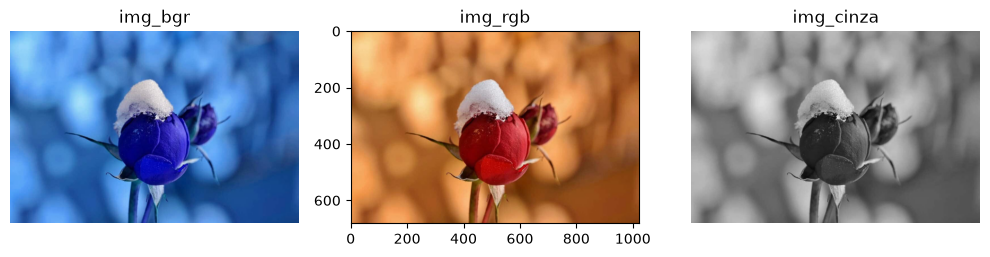

In [8]:
fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(10, 5))

ax0.imshow(img_colorida)
ax0.set_title("img_bgr")
ax0.axis("off")

ax1.imshow(cv2.cvtColor(img_colorida, cv2.COLOR_BGR2RGB))
ax1.set_title("img_rgb")
ax1.axis("on")

ax2.imshow(cv2.cvtColor(img_cinza, cv2.COLOR_BGR2RGB))
ax2.set_title("img_cinza")
ax2.axis("off")
plt.tight_layout()


### **Escrevendo uma imagem**

In [9]:
cv2.imwrite('output/img_colorida.jpg', img_colorida)
cv2.imwrite('output/img_cinza.png', img_cinza)

True

## **Redimensionamento de imagem**

O que acontece quando a imagem for escalada para ficar maior? A imagem resultante terá mais pixels a ser preenchidos. Para preencher os pixels adicionais, a função ***resize*** possui um parâmetro **interpolation** com valor padrão do tipo linear. A interpolação é um método de construção de dados para os novos pixels, e os principais tipos disponíveis são:

1. INTER_NEAREST: pixel vizinho mais próximo.
2. INTER_LINEAR: média dos 4 pixels vizinhos.
3. INTER_CUBIC: média dos 16 pixels vizinhos.

In [10]:
image1 = cv2.imread('image/flower.jpg', cv2.IMREAD_COLOR)
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
print(image1.shape)


(682, 1024, 3)


### **Redimensionamento por especificação de largura e altura**

(400, 600, 3)


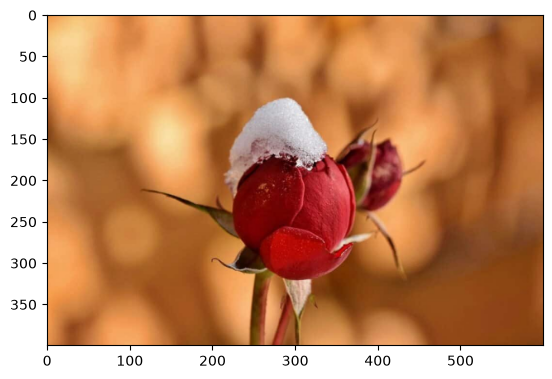

In [11]:
down_height = 400 #altura
down_width = 600 #largura
down_points = (down_width, down_height)

resized_down = cv2.resize(image1, down_points, interpolation= cv2.INTER_LINEAR)

#plt.imshow(cv2.cvtColor(resized_down, cv2.COLOR_BGR2RGB))
plt.imshow(resized_down)
print(resized_down.shape)

### **Redimensionamento com um fator de escala**

In [103]:

scale_up = 1.2 # aumenta a largura em 20% (já q 1.0 representa os 100% da img original...)

scale_down = 0.1 # reduzindo 10% do tamanho original

#O cv2.INTER_AREA => projetado para produzir bons resultados na redução
# de imagens, fazendo uma forma de reamostragem baseada na area dos pixels 
scaled_f_down = cv2.resize(image1, None, fx= scale_down, fy= scale_down, interpolation= cv2.INTER_AREA) 

scaled_f_up = cv2.resize(image1, None, fx= scale_up, fy= scale_up, interpolation= cv2.INTER_LINEAR)


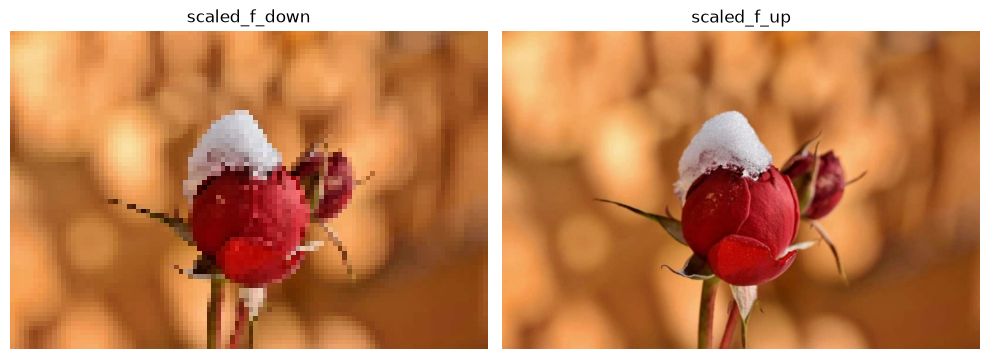

In [102]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10,5))

ax0.imshow(scaled_f_down)
ax0.set_title("scaled_f_down")
ax0.axis("off")

ax1.imshow(scaled_f_up)
ax1.set_title("scaled_f_up")
ax1.axis("off")
plt.tight_layout()


In [14]:
# Scaling Down the image 0.6 times using different Interpolation Method
res_inter_nearest = cv2.resize(image1, None, fx= scale_down, fy= scale_down, interpolation= cv2.INTER_NEAREST)
res_inter_linear = cv2.resize(image1, None, fx= scale_down, fy= scale_down, interpolation= cv2.INTER_LINEAR)
res_inter_area = cv2.resize(image1, None, fx= scale_down, fy= scale_down, interpolation= cv2.INTER_AREA)

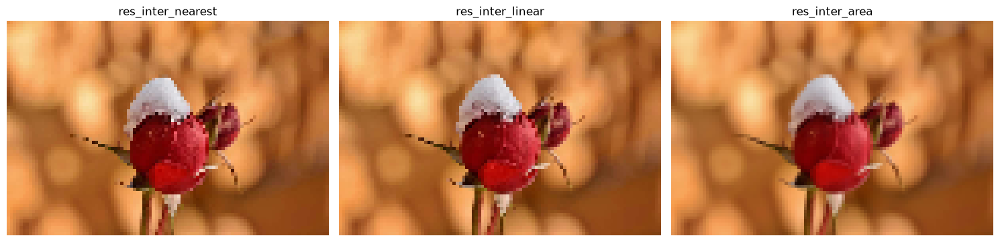

In [15]:
fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(15, 5))

ax0.imshow(res_inter_nearest)
ax0.set_title("res_inter_nearest")
ax0.axis("off")

ax1.imshow(res_inter_linear)
ax1.set_title("res_inter_linear")
ax1.axis("off")

ax2.imshow(res_inter_area)
ax2.set_title("res_inter_area")
ax2.axis("off")

plt.tight_layout()


## **Cortando uma imagem**

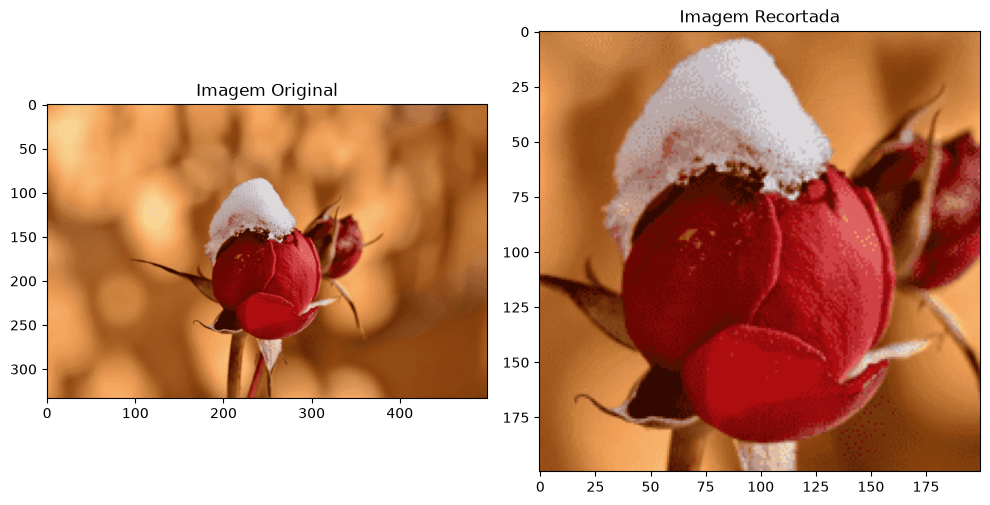

In [16]:
image2= cv2.imread('image/flower2.png')
image2= cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

#imagem[y_inicial : y_final, x_inicial : x_final]
cropped_image = image2[80:280, 150:350] # Slicing to crop the image

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))

ax0.imshow(image2)
ax0.set_title("Imagem Original")

ax1.imshow(cropped_image)
ax1.set_title("Imagem Recortada")

plt.tight_layout()


In [17]:
image_copy1 = image2.copy()
image_copy1 = cv2.resize(image_copy1, (520,380))

imgheight=image_copy1.shape[0]
imgwidth=image_copy1.shape[1]

print(image_copy1.shape)


(380, 520, 3)


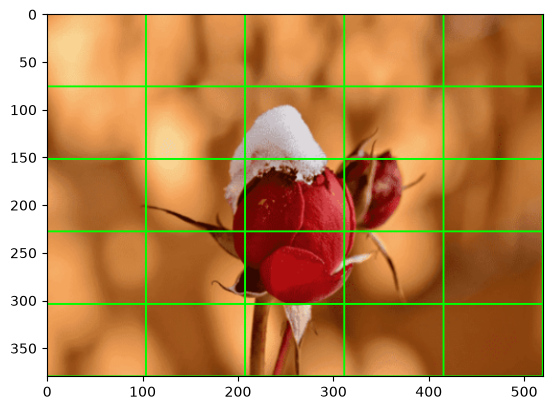

In [ ]:
image_copy1 = cv2.cvtColor(image_copy1,cv2.COLOR_BGR2RGB)

M = 76 #altura
N = 104 #largura
 
for y in range(0, imgheight, M):#vertical 
    for x in range(0, imgwidth, N):#horizontal
        height = min(M, imgheight - y) #caso ao chegar na borda não existir espaço para formar um pedaço completo
        width = min(N, imgwidth - x)
 
        # Slice to the clipped image boundary and make an independent tile.
        tiles = image_copy1[y:y + height, x:x + width].copy() #salva o pedaço individualmente

        if tiles.size == 0: #se n tiver nemnhum elemento de corte
            continue
 
        output = f"output/tile{x}_{y}.jpg"
        if not cv2.imwrite(output, tiles):
            raise OSError(f"Could not write {output}")

        cv2.rectangle(
            image_copy1,
            (x, y),
            (x + width - 1, y + height - 1),
            (0, 255, 0),
            1,
        )

cv2.imwrite("output/patched.jpg",image_copy1)
plt.imshow(cv2.cvtColor(image_copy1,cv2.COLOR_BGR2RGB))

## **Translação e Rotação**

A translação é a operação de mudança da localização de um objeto. No caso das imagens, a origem é alterada. Já a rotação é a alteração da orientação de um objeto, que no caso das imagens altera no próprio plano da janela de
exibição.

Ambas as operações são feitas com a função **warpAffine** passando a imagem original, a matriz de translação e o tamanho da imagem de resultado.

O experimento abaixo realiza a rotação de uma imagem em 45o em torno do seu próprio centro usando uma "transformação geométrica 2D".



### **Rotação**

In [19]:
image3 = cv2.imread('image/barco.png')
# --> Dividing height and width by 2 
# to get the center of the image
height, width = image3.shape[:2]
center = (width/2, height/2)

# the above center is the center of rotation axis
# use cv2.getRotationMatrix2D() to get the rotation matrix
rotate_matrix = cv2.getRotationMatrix2D(center=center, angle=45, scale=1)

# Rotate the image using cv2.warpAffine
rotated_image = cv2.warpAffine(src=image3, M=rotate_matrix, dsize=(width, height))

cv2.imwrite('output/rotated_image.jpg', rotated_image)

True

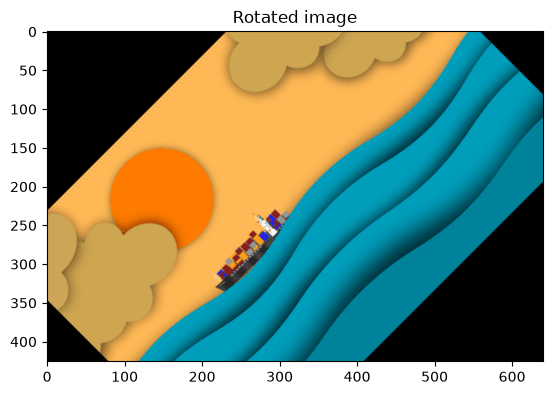

In [20]:
plt.title('Rotated image')
plt.imshow(cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB))


### **Translação**

In [ ]:
# get the width and height of the image
height, width = image3.shape[:2] 

# get tx and ty values for translation
# you can specify any value of your choice
tx, ty = width / 4, height / 4 #deslocamento no eito x horizontal e y vertical
 
# create the translation matrix using tx and ty, it is a NumPy array
translation_matrix = np.array([[1, 0, tx],[0, 1, ty]], dtype=np.float32) 

# apply the translation to the image
translated_image = cv2.warpAffine(src=image3, M=translation_matrix, dsize=(width, height))
cv2.imwrite('output/translated_image.jpg', translated_image)


True

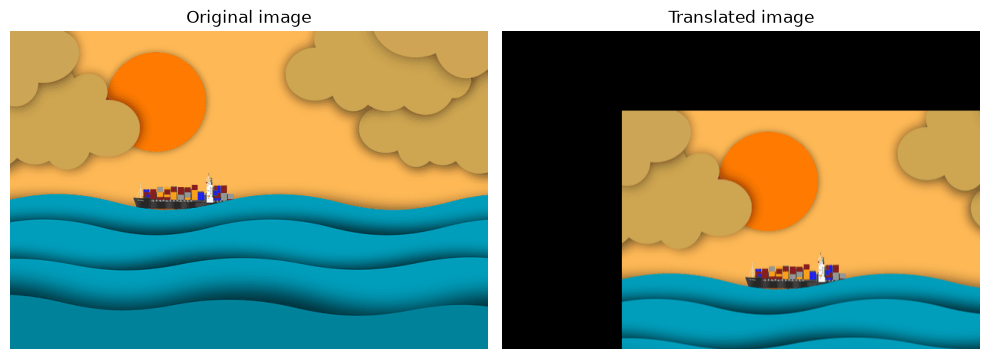

In [22]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))

ax0.imshow(cv2.cvtColor(image3, cv2.COLOR_BGR2RGB))
ax0.set_title("Original image")
ax0.axis("off")

ax1.imshow(cv2.cvtColor(translated_image, cv2.COLOR_BGR2RGB))
ax1.set_title("Translated image")
ax1.axis("off")

plt.tight_layout()



## **Desenho e Marcação de Imagens**

### **Desenhando uma linha**

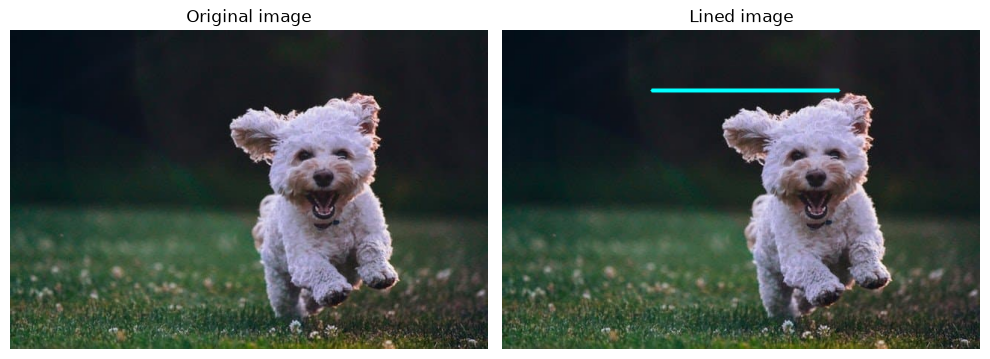

In [23]:
image4 = cv2.imread('image/cachorro.jpg')

# Draw line on image
imageLine = image4.copy()
# Draw the image from point A to B
pointA = (200,80)
pointB = (450,80)

linha = cv2.line(imageLine, pointA, pointB, (255, 255, 0), thickness=3, lineType=cv2.LINE_AA)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))

ax0.imshow(cv2.cvtColor(image4, cv2.COLOR_BGR2RGB))
ax0.set_title("Original image")
ax0.axis("off")

ax1.imshow(cv2.cvtColor(linha, cv2.COLOR_BGR2RGB))
ax1.set_title("Lined image")
ax1.axis("off")

plt.tight_layout()

### **Desenhando um Círculo**

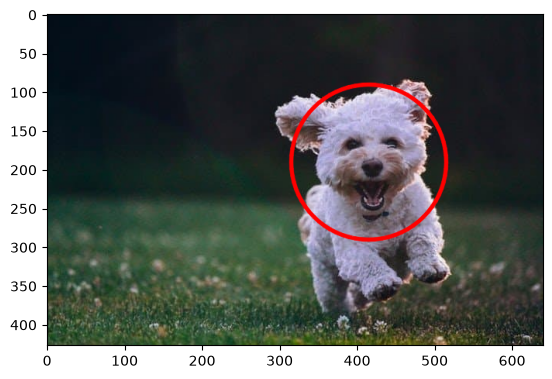

In [24]:
# Make a copy of image
imageCircle = image4.copy()
# define the center of circle
circle_center = (415,190)
# define the radius of the circle
radius =100
#  Draw a circle using the circle() Function
circulo = cv2.circle(imageCircle, circle_center, radius, (0, 0, 255), thickness=3, lineType=cv2.LINE_AA)
# Display the result
plt.imshow(cv2.cvtColor(circulo, cv2.COLOR_BGR2RGB))


### **Desenhando um Círculo Preenchido**

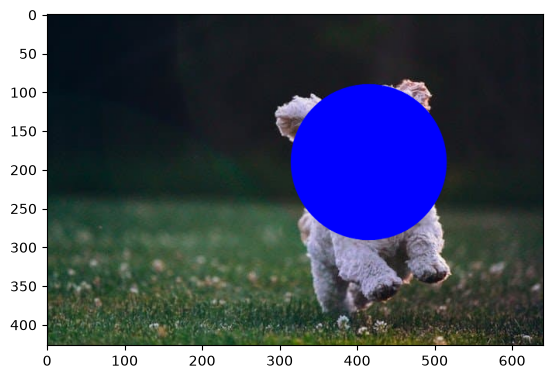

In [25]:
# make a copy of the original image
imageFilledCircle = image4.copy()
# define center of the circle
circle_center = (415,190)
# define the radius of the circle
radius =100
# draw the filled circle on input image
circulo_p = cv2.circle(imageFilledCircle, circle_center, radius, (255, 0, 0), thickness=-1, lineType=cv2.LINE_AA)
# display the output image
plt.imshow(cv2.cvtColor(circulo_p, cv2.COLOR_BGR2RGB))

### **Desenhando um Retângulo**

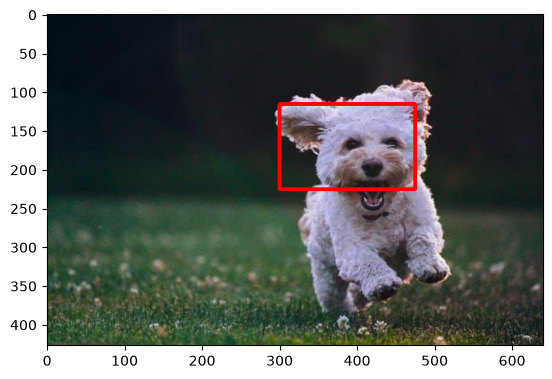

In [26]:
# make a copy of the original image
imageRectangle = image4.copy()
# define the starting and end points of the rectangle
start_point =(300,115)
end_point =(475,225)
# draw the rectangle
rect = cv2.rectangle(imageRectangle, start_point, end_point, (0, 0, 255), thickness= 3, lineType=cv2.LINE_8)
# display the output
plt.imshow(cv2.cvtColor(rect, cv2.COLOR_BGR2RGB))

### **Desenhando uma Elipse**

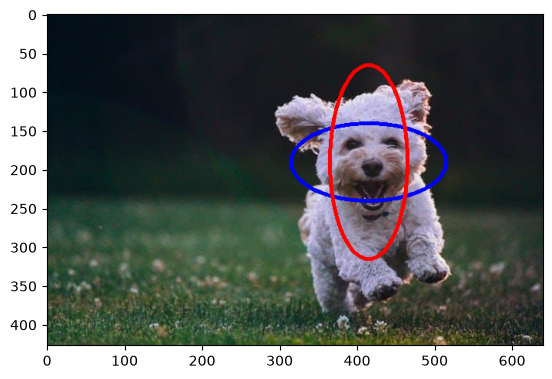

In [27]:
# make a copy of the original image
imageEllipse = image4.copy()
# define the center point of ellipse
ellipse_center = (415,190)
# define the major and minor axes of the ellipse
axis1 = (100,50)
axis2 = (125,50)
# draw the ellipse
#Horizontal
ellipse1 = cv2.ellipse(imageEllipse, ellipse_center, axis1, 0, 0, 360, (255, 0, 0), thickness=3)
#Vertical
ellipse = cv2.ellipse(ellipse1, ellipse_center, axis2, 90, 0, 360, (0, 0, 255), thickness=3)
# display the output 
plt.imshow(cv2.cvtColor(ellipse, cv2.COLOR_BGR2RGB))


### **Desenhando uma meia-elipse**

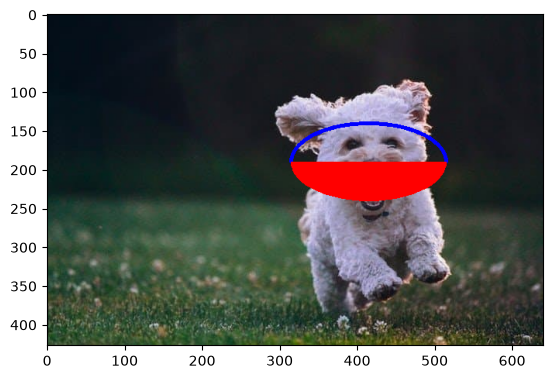

In [28]:
# make a copy of the original image
halfEllipse = image4.copy()
# define the center of half ellipse
ellipse_center = (415,190)
# define the axis point
axis1 = (100,50)
# draw the Incomplete/Open ellipse, just a outline
h_ellipse1= cv2.ellipse(halfEllipse, ellipse_center, axis1, 0, 180, 360, (255, 0, 0), thickness=3)
# if you want to draw a Filled ellipse, use this line of code
h_ellipse=cv2.ellipse(h_ellipse1, ellipse_center, axis1, 0, 0, 180, (0, 0, 255), thickness=-2)
# display the output
plt.imshow(cv2.cvtColor(h_ellipse, cv2.COLOR_BGR2RGB))


### **Adicionando texto**

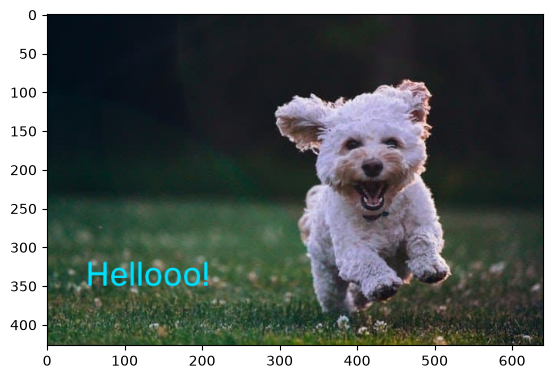

In [29]:
# make a copy of the original image
imageText = image4.copy()
#let's write the text you want to put on the image
text = 'Hellooo!'
#org: Where you want to put the text
org = (50,350)
# write the text on the input image
text_img= cv2.putText(imageText, text, org, fontFace = cv2.FONT_HERSHEY_COMPLEX, fontScale = 1.5, color = (255,225,0))
# display the output image with text over it
plt.imshow(cv2.cvtColor(text_img, cv2.COLOR_BGR2RGB))

## **Filtragem Espacial**

Em visão computacional, os filtros desempenham seu papel ao realizar uma **convolução** na imagem com um elemento estruturante, o **kernel**.

Um kernel convolucional é uma matriz 2D que é usada para filtrar imagens. Um kernel de convolução é tipicamente uma matriz quadrada, MxN, onde M e NN são inteiros ímpares (por exemplo, 3×3, 5×5, 7×7 etc.).

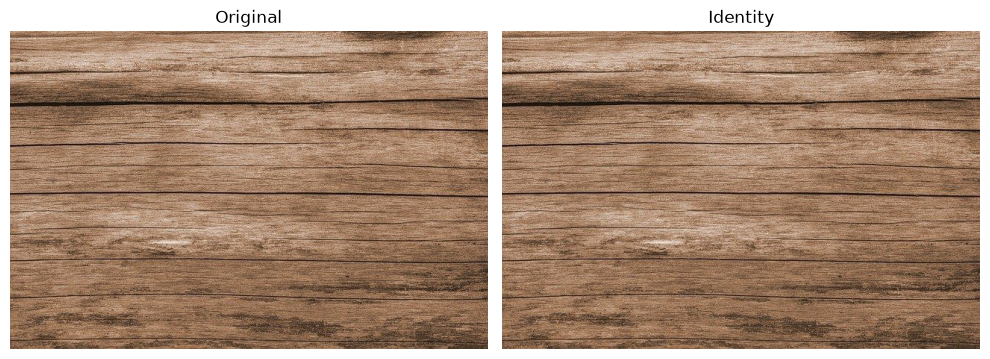

In [ ]:
image5 = cv2.imread('image/madeira.jpg')

#Apply identity kernel

kernel1 = np.array([[0, 0, 0],
                    [0, 1, 0],
                    [0, 0, 0]])
# filter2D() function can be used to apply kernel to an image.
# Where ddepth is the desired depth of final image. ddepth is -1 if...
# ... depth is same as original or source image. o tipo/profundidade dos dados da imagem de saida
identity = cv2.filter2D(src=image5, ddepth=-1, kernel=kernel1)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))

ax0.imshow(cv2.cvtColor(image5, cv2.COLOR_BGR2RGB))
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(cv2.cvtColor(identity, cv2.COLOR_BGR2RGB))
ax1.set_title("Identity")
ax1.axis("off")

plt.tight_layout()



### **Filtro de Média**

No experimento abaixo para realizar o desfoque de uma imagem, utiliza-se um kernel personalizado de tamanho 5×5, preenchido com valores iguais a 1. Como o kernel possui 25 elementos, seus valores são divididos por 25 para realizar a normalização, fazendo com que a soma de seus elementos seja igual a 1 e mantendo a intensidade média da imagem durante a filtragem. Em seguida, a função filter2D() é utilizada para aplicar o kernel à imagem por meio de uma operação de convolução. Como todos os elementos do kernel possuem o mesmo valor, cada pixel passa a ser influenciado pela média dos pixels de sua vizinhança, resultando no efeito de desfoque.

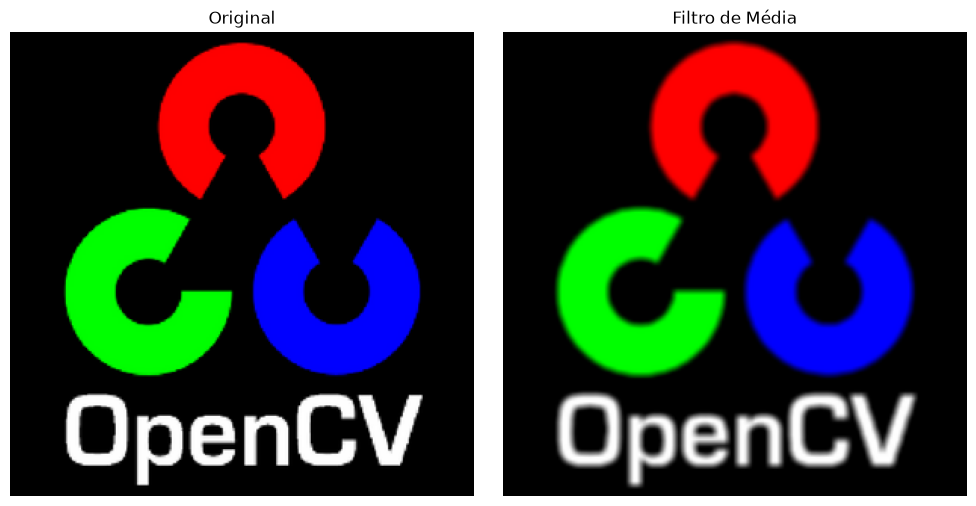

In [ ]:
image6 = cv2.imread('image/opencv.png')

kernel2 = np.ones((5, 5), np.float32) / 25

res= cv2.filter2D(src=image6, ddepth=-1, kernel=kernel2)

cv2.imwrite('output/filtroMedia.png', res)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))

ax0.imshow(cv2.cvtColor(image6, cv2.COLOR_BGR2RGB))
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB))
ax1.set_title("Filtro de Média")
ax1.axis("off")

plt.tight_layout()


### **Função Blur**

Nesta função não é necessário definir um kernel manualmente (Criar a matriz linha por linha e preencher os números/pesos que estarão dentro dela antes de filtrar). Podemos utilizar o **ksize** assim a função desfoque criará internamente um kernel de desfoque '5×5' e o aplicará à imagem de origem.

cv2.blur() implementa o filtro de média

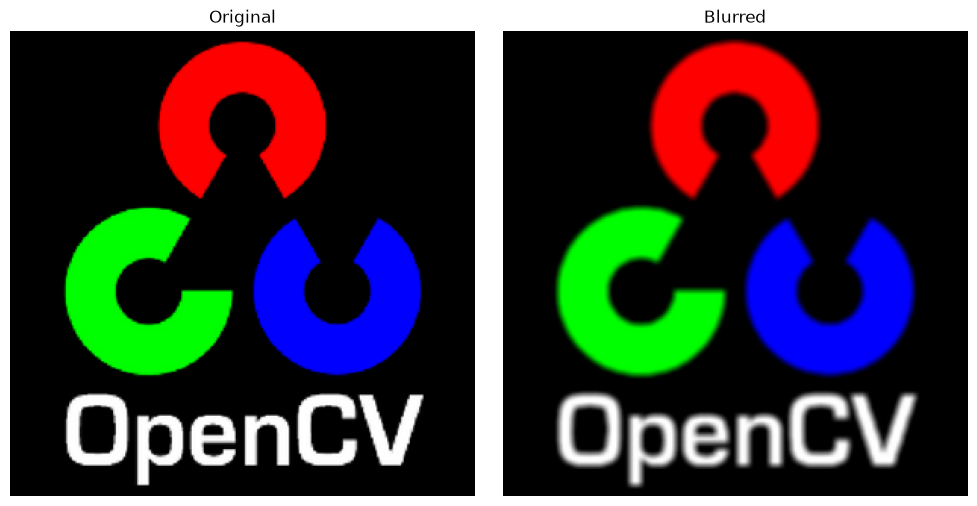

In [32]:
"""
Apply blur using `blur()` function
"""
img_blur = cv2.blur(src=image6, ksize=(5,5)) # Using the blur function to blur an image where ksize is the kernel size

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))

ax0.imshow(cv2.cvtColor(image6, cv2.COLOR_BGR2RGB))
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(cv2.cvtColor(img_blur, cv2.COLOR_BGR2RGB))
ax1.set_title("Blurred")
ax1.axis("off")

plt.tight_layout()

É possivel realizar o efeito inverso do embaçamento (o aguçamento) somando a imagem original com a diferença entre a imagem original e a filtrada...

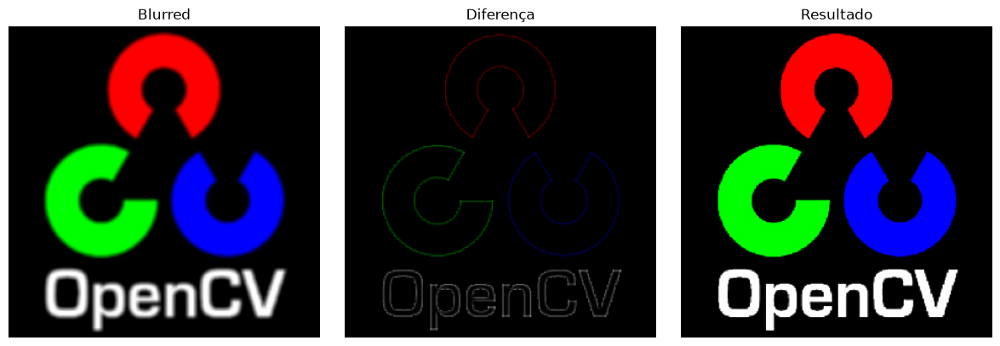

In [33]:
imageSub= cv2.subtract(image6, img_blur)
imageAdd= cv2.add(imageSub, image6)

fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(12, 4))
ax0.imshow(cv2.cvtColor(img_blur, cv2.COLOR_BGR2RGB))
ax0.set_title("Blurred")
ax0.axis("off")

ax1.imshow(cv2.cvtColor(imageSub, cv2.COLOR_BGR2RGB))
ax1.set_title("Diferença")
ax1.axis("off")

ax2.imshow(cv2.cvtColor(imageAdd, cv2.COLOR_BGR2RGB))
ax2.set_title("Resultado")
ax2.axis("off")

plt.tight_layout()

### **Filtro Gaussiano**

Em processamento de imagens, este filtro é excelente para remoção de ruídos gaussianos, o tipo de ruído semelhante à estática de televisores antigos.
A função do filtro Gaussiano pode ser utilizada da seguinte maneira abaixo, onde o primeiro parâmetro é a imagem, o segundo parâmetro é o tamanho do kernel e o terceiro refere-se ao cálculo dos valores dentro do kernel. O valor “0” permite que a função calcule automaticamente os valores padrão.

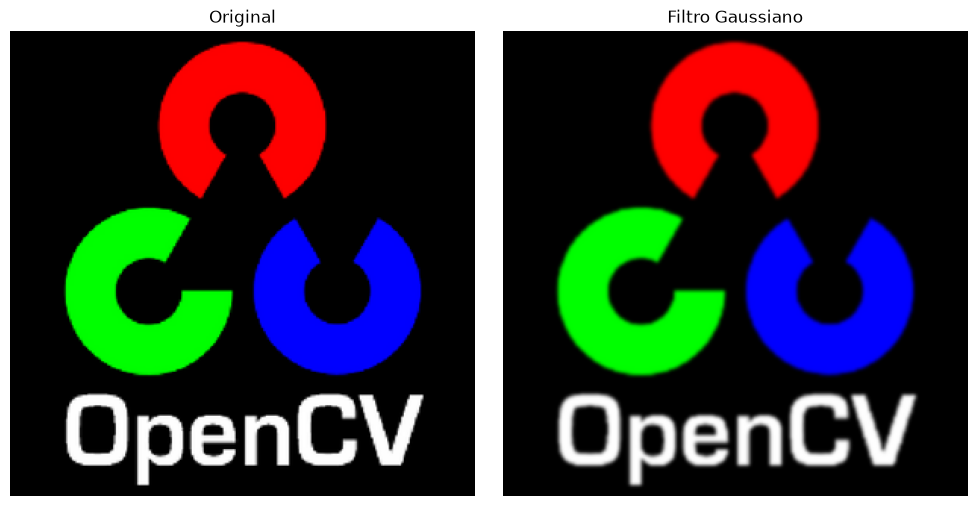

In [34]:
gaussian_blur = cv2.GaussianBlur(src=image6, ksize=(5,5), sigmaX=0, sigmaY=0)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))

ax0.imshow(cv2.cvtColor(image6, cv2.COLOR_BGR2RGB))
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(cv2.cvtColor(gaussian_blur, cv2.COLOR_BGR2RGB))
ax1.set_title("Filtro Gaussiano")
ax1.axis("off")

plt.tight_layout()


### **Filtro de Mediana**

O filtro de mediana é diferente dos outros filtros, pois não utiliza uma convolução na imagem. Este filtro verifica o valor mediano de uma região de pixels, o que é excelente para remover ruídos do tipo “sal e pimenta”, que é o
ruído caracterizado por pontos brancos e pretos.


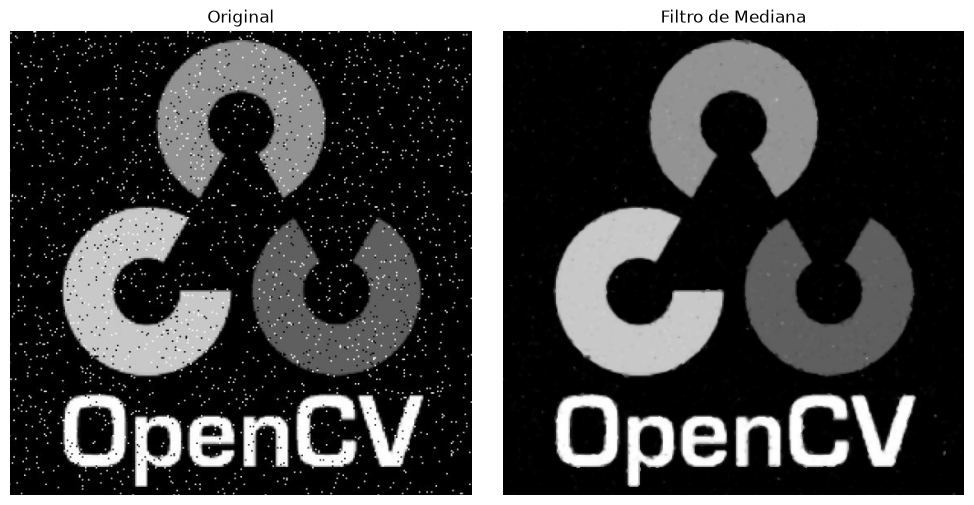

In [35]:
image7= cv2.imread("image/salepimenta.JPG")
median = cv2.medianBlur(src=image7, ksize=5)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))

ax0.imshow(cv2.cvtColor(image7, cv2.COLOR_BGR2RGB))
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(cv2.cvtColor(median, cv2.COLOR_BGR2RGB))
ax1.set_title("Filtro de Mediana")
ax1.axis("off")

plt.tight_layout()



## **Limiar de uma Imagem**

A operação de binarização converte os valores dos pixels para 0 ou 1 (255) a partir de um determinado limiar. Limiares mais próximos de 0 produzirão imagens mais claras, pois converterão mais áreas escuras em branco, enquanto limiares mais próximos de 255 produzirão imagens mais escuras, pois converterão áreas mais claras em preto.

Para realizar a binarização de uma imagem, utiliza-se a função **threshold()**, responsável por classificar os pixels de acordo com um determinado limiar. A função recebe como parâmetros a imagem a ser tratada, o limiar de binarização, que define o valor utilizado para a classificação dos pixels, e o valor máximo, normalmente definido como 255, atribuído aos pixels que atendem à condição estabelecida.

### **Limiar Binário**

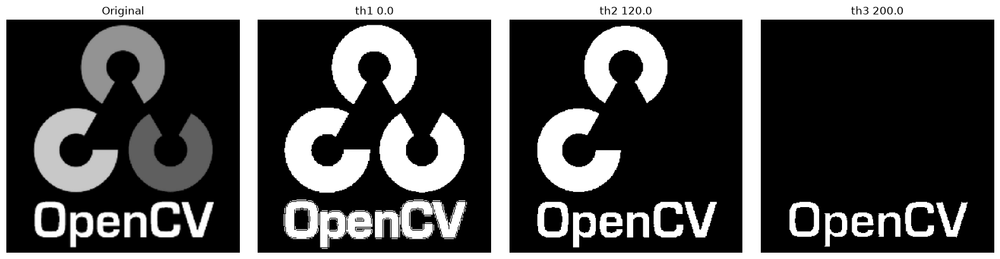

In [36]:
image8= cv2.imread("image/opencv.png", cv2.IMREAD_GRAYSCALE)

thresh1 = 0
thresh2 = 120
thresh3 = 200

maxValue= 255

th1, dst1 = cv2.threshold(image8, thresh1, maxValue, cv2.THRESH_BINARY)
th2, dst2 = cv2.threshold(image8, thresh2, maxValue, cv2.THRESH_BINARY)
th3, dst3 = cv2.threshold(image8, thresh3, maxValue, cv2.THRESH_BINARY)

fig, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4, figsize=(16, 4))

ax0.imshow(cv2.cvtColor(image8, cv2.COLOR_BGR2RGB))
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(dst1, cmap="gray")
ax1.set_title(f"th1 {th1}")
ax1.axis("off")

ax2.imshow(dst2, cmap="gray")
ax2.set_title(f"th2 {th2}")
ax2.axis("off")

ax3.imshow(dst3, cmap="gray")
ax3.set_title(f"th3 {th3}")
ax3.axis("off")

plt.tight_layout()
plt.show()


Alguns tipos de binarização simples são:

1. BINARY: valor máximo se acima do limiar, senão 0;

2. BINARY_INV: valor 0 se acima do limiar, senão valor máximo;

3. TRUNC: valor do limiar se acima do limiar, senão 0;

4. TOZERO: valor original se acima do limiar, senão 0;

5. TOZERO_INV: valor 0 se acima do limiar, senão valor original.

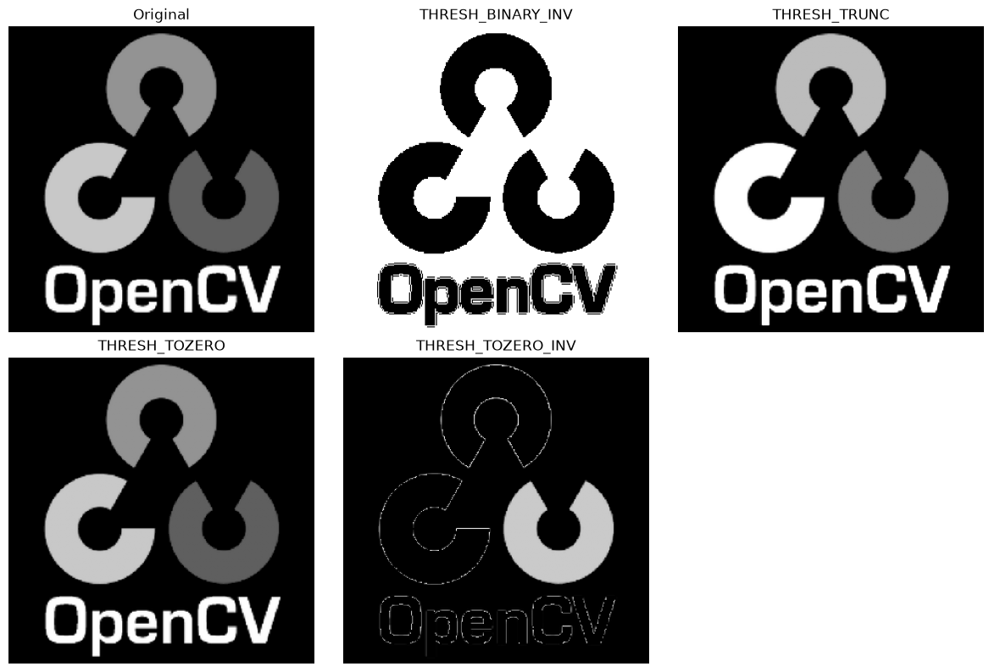

In [37]:
_, dst4 = cv2.threshold(image8, thresh1, maxValue, cv2.THRESH_BINARY_INV)
_, dst5 = cv2.threshold(image8, thresh3, maxValue, cv2.THRESH_TRUNC)
_, dst6 = cv2.threshold(image8, thresh1, maxValue, cv2.THRESH_TOZERO)
_, dst7 = cv2.threshold(image8, thresh2, maxValue, cv2.THRESH_TOZERO_INV)


fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(2, 3, figsize=(12, 8))

ax0.imshow(cv2.cvtColor(image8, cv2.COLOR_BGR2RGB))
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(dst4, cmap="gray")
ax1.set_title("THRESH_BINARY_INV")
ax1.axis("off")

ax2.imshow(dst5, cmap="gray")
ax2.set_title("THRESH_TRUNC")
ax2.axis("off")

ax3.imshow(dst6, cmap="gray")
ax3.set_title("THRESH_TOZERO")
ax3.axis("off")

ax4.imshow(dst7, cmap="gray")
ax4.set_title("THRESH_TOZERO_INV")
ax4.axis("off")

ax5.axis("off")

plt.tight_layout()
plt.show()

Para utilizar uma seleção automática de limiar, é possível utilizar o tipo OTSU em combinação com um tipo simples da seguinte maneira:

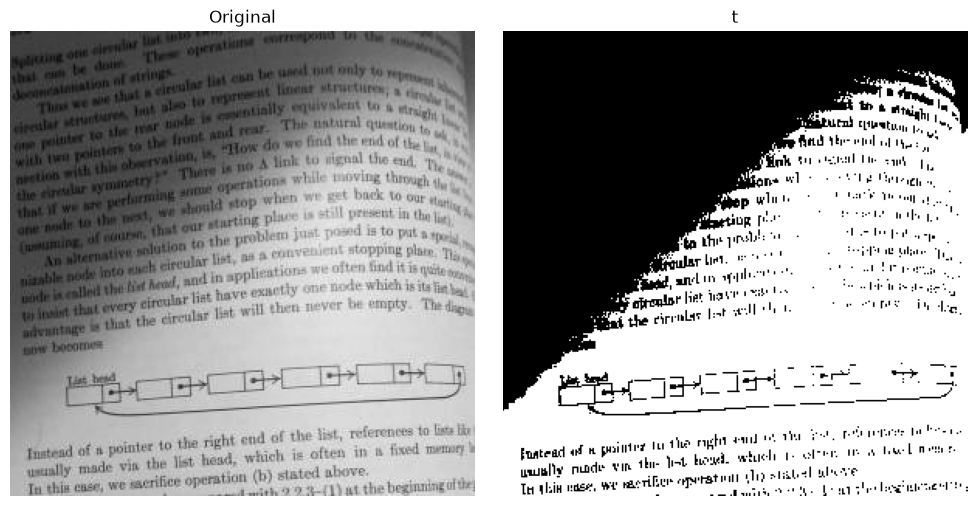

In [38]:
image9 = cv2.imread('image/livro.jpg', cv2.IMREAD_GRAYSCALE)

limiarEncontrado, imgProcessada = cv2.threshold(image9, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize = (10, 5))

ax0.imshow(image9, cmap='gray')
ax0.set_title('Original')
ax0.axis("off")

ax1.imshow(imgProcessada, cmap='gray')
ax1.set_title('t')
ax1.axis("off")
plt.tight_layout()

Porém os tipos de binarização simples nem sempre conseguem fazer uma boa segmentação de características. No caso de imagens com iluminação variável, certas áreas ficarão muito escuras e outras muito claras.

Este tipo de situação pode ser contornado com binarização adaptativa utilizando a função **adaptativeThreshold** passando 6 parâmetros: 
1. imagem a ser tratada;
2. valor máximo;
3. tipo de limiar adaptativo;
4. tipo de binarização
5. tamanho do bloco de análise
6. Um valor para subtrair do valor resultante. 

Os tipos de limiar adaptativo são:

1. Soma ponderada por valores gaussianos no bloco menos uma
constante **ADAPTATIVE_THRESH_GAUSSIAN_C**
2. Valor da média do bloco menos uma constante **ADAPTATIVE_THRESH_MEAN_C**

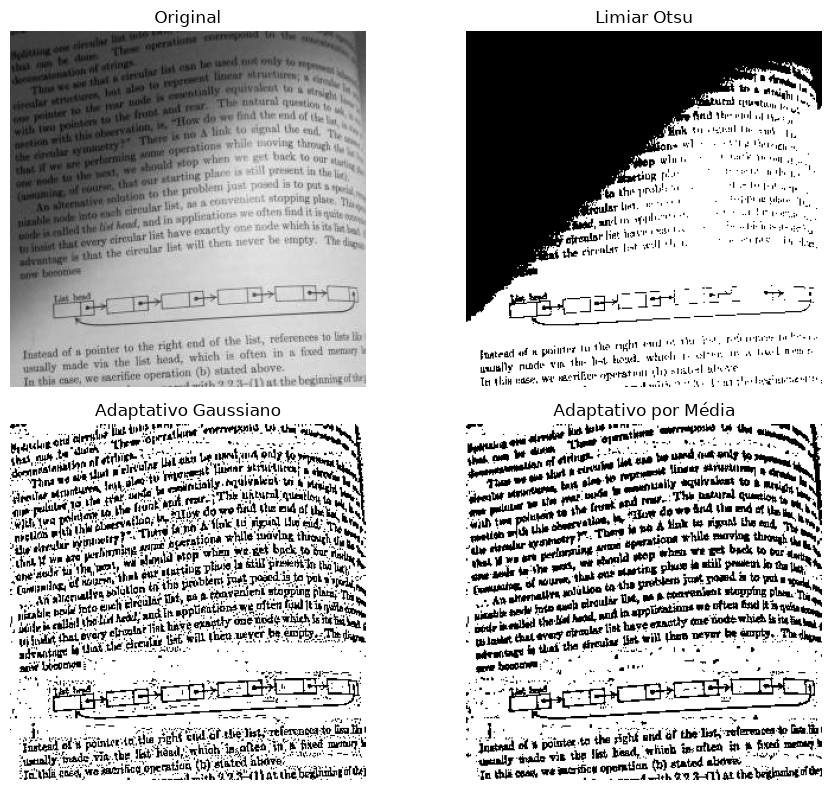

In [39]:
at1 = cv2.adaptiveThreshold(image9, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
at2 = cv2.adaptiveThreshold(image9, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)

fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(2, 2, figsize=(10, 8))

ax0.imshow(image9, cmap='gray')
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(imgProcessada, cmap='gray')
ax1.set_title("Limiar Otsu")
ax1.axis("off")

ax2.imshow(at1, cmap='gray')
ax2.set_title("Adaptativo Gaussiano")
ax2.axis("off")

ax3.imshow(at2, cmap='gray')
ax3.set_title("Adaptativo por Média")
ax3.axis("off")

plt.tight_layout()


### **Removendo Ruído e aplicando a binarização**

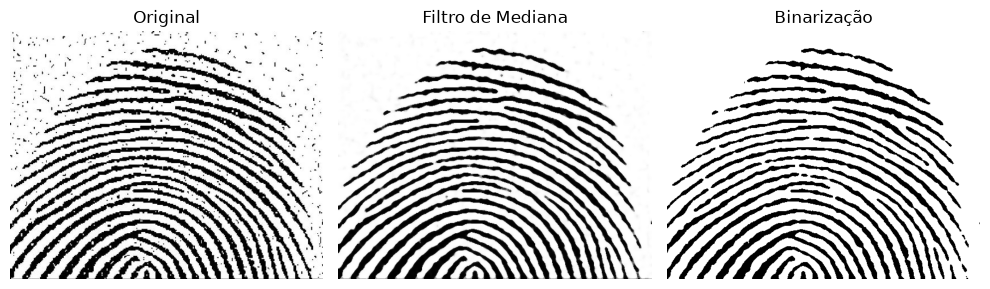

In [40]:
image9 = cv2.imread('image/biometria.JPG')
median9 = cv2.medianBlur(src=image9, ksize=7)
_, bina= cv2.threshold(median9, 50, maxValue, cv2.THRESH_BINARY)

fig, (ax0, ax1,ax2) = plt.subplots(1, 3, figsize=(10, 5))

ax0.imshow(cv2.cvtColor(image9, cv2.COLOR_BGR2RGB))
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(cv2.cvtColor(median9, cv2.COLOR_BGR2RGB))
ax1.set_title("Filtro de Mediana")
ax1.axis("off")

ax2.imshow(cv2.cvtColor(bina, cv2.COLOR_BGR2RGB))
ax2.set_title("Binarização")
ax2.axis("off")


plt.tight_layout()

## **Detecção de Contornos**



Passos para detectar e desenhar contornos no OpenCV:

1. Ler a imagem e convertê-la em formato Grayscale;
2. Aplicar a binarização por limiar;
3. Encontrar os contornos na imagem binária;
4. Desenhar os contornos na imagem original.

A função **cv2.findContours()** identifica os contornos presentes (percorre os pixels da imagem identificando as fronteiras das regiões brancas em relação ao fundo preto) na imagem binária e retorna suas coordenadas.



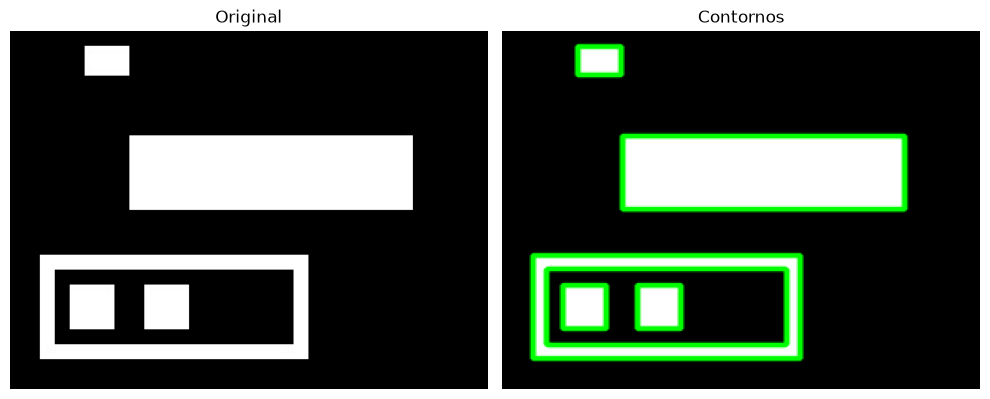

In [ ]:
image10 = cv2.imread('image/hierarquia.jpg', cv2.IMREAD_GRAYSCALE)

_, bina= cv2.threshold(image10, 50, maxValue, cv2.THRESH_BINARY)

contours, hierarchy = cv2.findContours(image=bina, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)

image_copy = image10.copy()

image_copy = cv2.cvtColor(image_copy, cv2.COLOR_BGR2RGB)

cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))

ax0.imshow(image10, cmap='gray')
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(image_copy)
ax1.set_title("Contornos")
ax1.axis("off")

plt.tight_layout()



## **Morfologia**

Processamentos morfológicos são operações de convolução semelhantes aos filtros que alteram a forma dos objetos da imagem. As principais operações morfológicas são a erosão e a dilatação.

A função **getStructuringElement** fornece um kernel(ou elemento estruturante) com formatos de retângulo, elipse ou cruz. Os parâmetros utilizados são o formato do kernel, as dimensões do kernel e um parâmetro opcional do ponto central do kernel. Outros formatos de kernel também podem ser gerados com funções da biblioteca numpy.

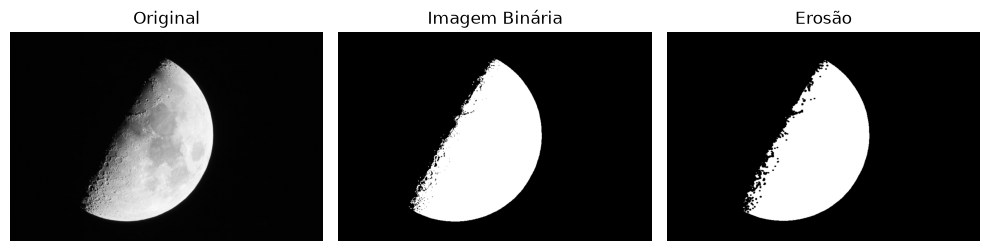

In [64]:
image11= cv2.imread("image/moon.jpg", cv2.IMREAD_GRAYSCALE)
limiar, img_binaria = cv2.threshold(image11, 50, 255, cv2.THRESH_BINARY)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
res = cv2.erode(img_binaria, kernel)

fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(10, 5))

ax0.imshow(image11, cmap='gray')
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(img_binaria, cmap='gray')
ax1.set_title("Imagem Binária")
ax1.axis("off")

ax2.imshow(res, cmap='gray')
ax2.set_title("Erosão")
ax2.axis("off")

plt.tight_layout()


A operação de **erosão** utiliza um kernel fazendo uma operação de AND, ou seja, o resultado é positivo se todos os pixels da vizinhança estão preenchidos. A erosão é realizada com a função erode, passando 2 parâmetros obrigatórios: a imagem a ser processada e o kernel. Existem mais parâmetros opcionais como o número de iterações, tipo de tratamento da borda e centro do kernel.

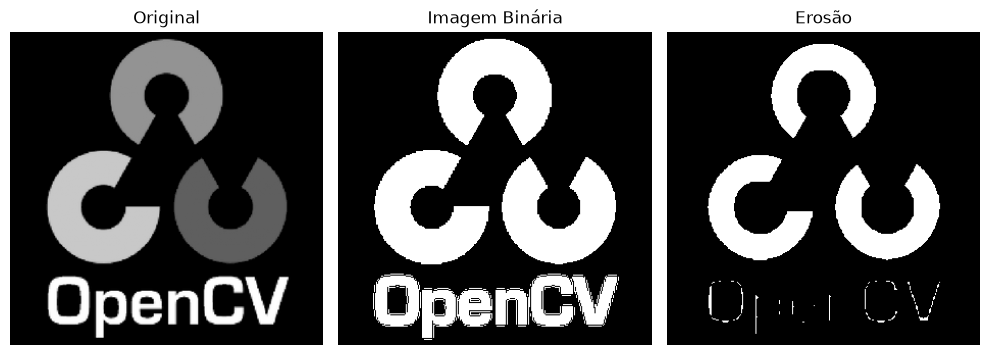

In [69]:
image12= cv2.imread("image/opencv.png", cv2.IMREAD_GRAYSCALE)
limiar, img_binaria = cv2.threshold(image12, 0, 255, cv2.THRESH_BINARY)

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10,10))
res = cv2.erode(img_binaria, kernel)

fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(10, 5))

ax0.imshow(image12, cmap='gray')
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(img_binaria, cmap='gray')
ax1.set_title("Imagem Binária")
ax1.axis("off")

ax2.imshow(res, cmap='gray')
ax2.set_title("Erosão")
ax2.axis("off")

plt.tight_layout()


A operação de **dilatação** utiliza um kernel realizando uma operação de OR, ou seja, o resultado é positivo se um pixel da vizinhaça está preenchido. A dilatação é feita com a função dilate com os mesmos parâmetros que a função de erosão.

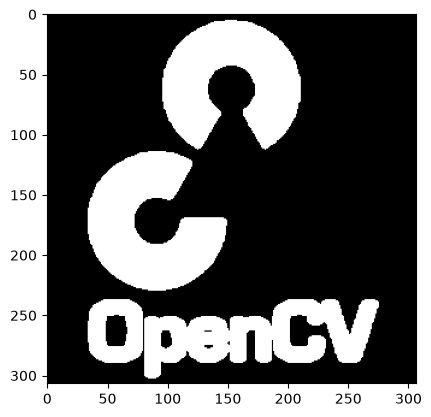

In [44]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))
res = cv2.dilate(img_binaria, kernel)

plt.imshow(res, cmap='gray')

Outras operações morfológicas podem ser realizadas com a função **morphologyEx**, passando 3 parâmetros: imagem a ser processada, tipo de operação morfológica e kernel. Outros tipos de operação disponíveis são:

1. MORPH_OPEN (Abertura): Erosão seguida de dilatação, ótimo para
eliminar pequenos objetos e conexões finas;
2. MORPH_CLOSE (Fechamento): Dilatação seguida de erosão, ótimo
para eliminar pequenos buracos e para engrossar conexões finas;
3. MORPH_GRADIENT: Dilatação menos erosão, pode ser utilizado para
detectar bordas;
4. MORPH_TOPHAT: Original menos abertura;
5. MORPH_BLACKHAT: Fechamento menos original;

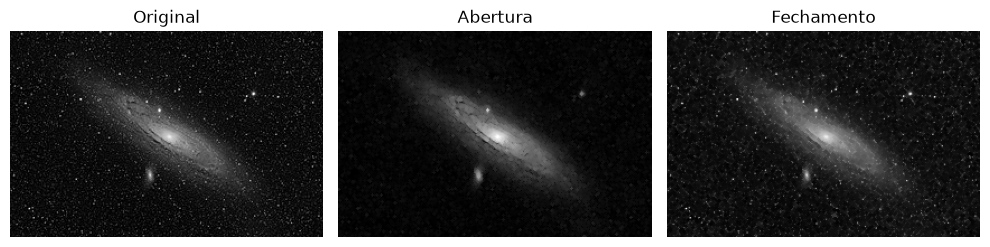

In [45]:
image13= cv2.imread("image/andromeda.jpg", cv2.IMREAD_GRAYSCALE)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
res = cv2.morphologyEx(image13, cv2.MORPH_OPEN, kernel)
res2 = cv2.morphologyEx(image13, cv2.MORPH_CLOSE, kernel)

fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(10, 5))

ax0.imshow(image13, cmap="gray")
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(res, cmap="gray")
ax1.set_title("Abertura")
ax1.axis("off")

ax2.imshow(res2, cmap="gray")
ax2.set_title("Fechamento")
ax2.axis("off")


plt.tight_layout()


## **Aspectos e Geometria**

### **Filtro de Sobel**

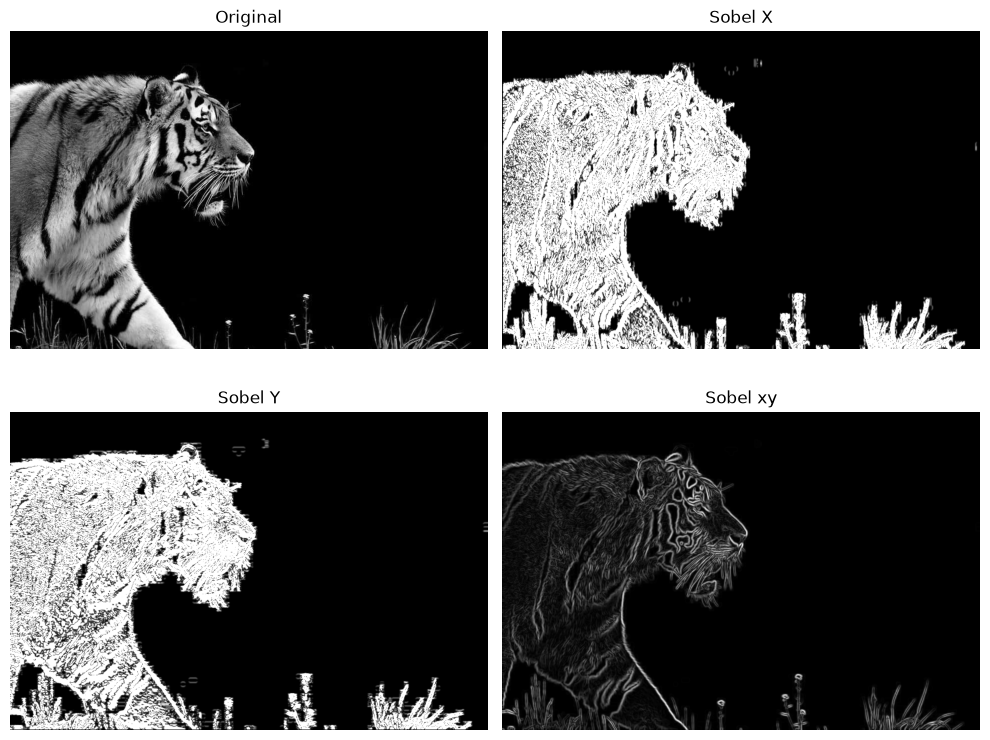

In [ ]:
image14 = cv2.imread("image/tigre.jpg", cv2.IMREAD_GRAYSCALE)
# Blur the image for better edge detection
img_blur = cv2.GaussianBlur(image14,(3,3), sigmaX=0, sigmaY=0) 

sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_32F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_32F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis

sobelxy = cv2.magnitude(sobelx, sobely) # Euclidean gradient magnitude

sobelxy =  cv2.normalize(sobelxy, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
sobelx = cv2.convertScaleAbs(sobelx)
sobely = cv2.convertScaleAbs(sobely)

fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(2, 2, figsize=(10, 8))

ax0.imshow(cv2.cvtColor(image14, cv2.COLOR_BGR2RGB))
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(cv2.cvtColor(sobelx, cv2.COLOR_BGR2RGB))
ax1.set_title("Sobel X")
ax1.axis("off")

ax2.imshow(cv2.cvtColor(sobely, cv2.COLOR_BGR2RGB))
ax2.set_title("Sobel Y")
ax2.axis("off")

ax3.imshow(cv2.cvtColor(sobelxy, cv2.COLOR_BGR2RGB))
ax3.set_title("Sobel xy")
ax3.axis("off")

plt.tight_layout()
plt.show()

### **Operador de Laplace**

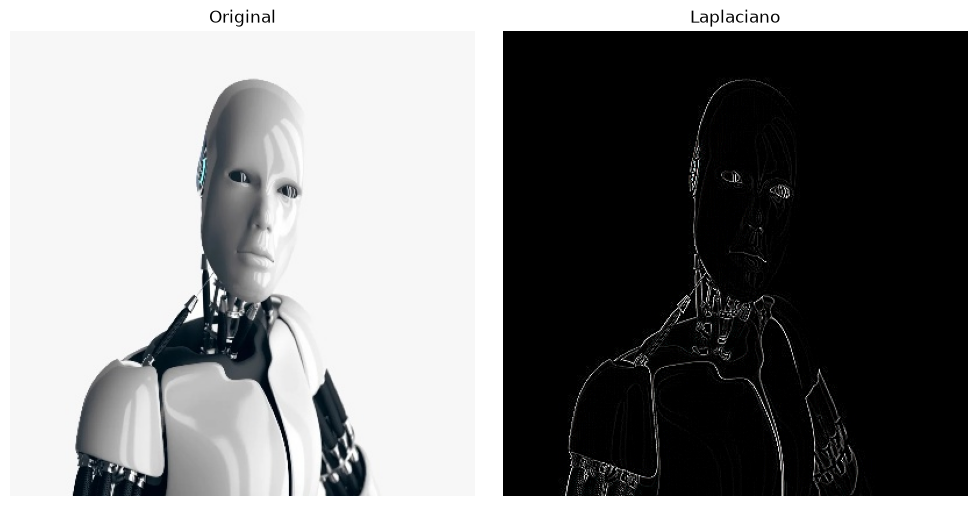

In [47]:
image15 = cv2.imread("image/robot.jpg")

res = cv2.Laplacian(image15, -1)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))

ax0.imshow(cv2.cvtColor(image15, cv2.COLOR_BGR2RGB))
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB))
ax1.set_title("Laplaciano")
ax1.axis("off")

plt.tight_layout()


### **Detector de bordas Canny**

O detector de bordas Canny é um dos métodos de detecção  mais populares, porque é robusto e flexível. O algoritmo em si segue um processo de três estágios para extrair bordas de uma imagem. Adicione a ele desfoque de imagem, uma etapa de pré-processamento necessária para reduzir o ruído. Isso faz com que seja um processo de quatro estágios, que inclui:

1. Redução de Ruído
2. Calculando o gradiente de intensidade da imagem
3. Supressão de bordas falsas
4. Histerese Thresholding

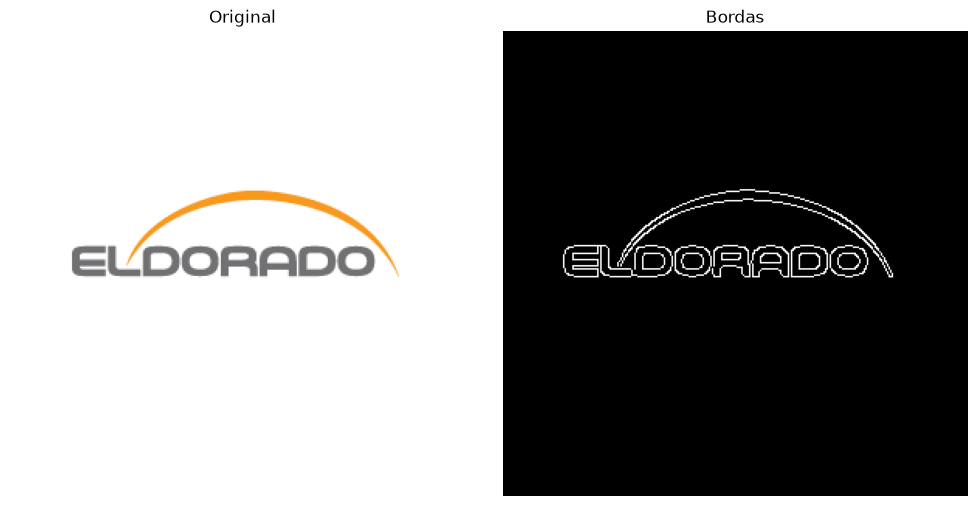

In [48]:
image16 = cv2.imread("image/institutoeldorado.png")

bordas = cv2.Canny(image16, 100, 200)
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))

ax0.imshow(cv2.cvtColor(image16, cv2.COLOR_BGR2RGB))
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(cv2.cvtColor(bordas, cv2.COLOR_BGR2RGB))
ax1.set_title("Bordas")
ax1.axis("off")

plt.tight_layout()
plt.show()

### **Detecção por Cores**

Diferentemente da representação BGR, para detectarmos um objeto por sua cor utilizamos o espaço HSV, pois tentar isolar cores é uma tarefa mais complicada em BGR. Por exemplo, o amarelo é a mistura dos canais de vermelho e verde, mas se ambos estiverem no máximo (255) será considerado amarelo da mesma forma com ambos em valor mediano e igual (por exemplo 128), gerando amarelo escurecido.

O espaço HSV possui 3 canais representando: matiz (hue), saturação e valor (value). A matiz representa a tonalidade de cor em um só canal, variando de 0 a 180. A saturação é o segundo canal e varia de 0 a 255, representando quão vívida é a cor. E por último, o valor é o terceiro canal, que varia de 0 a 255 representando a luminosidade.


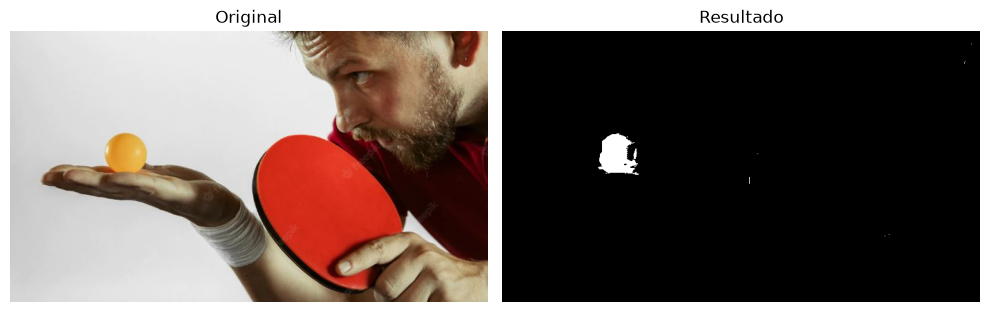

In [49]:
image17 = cv2.imread("image/pingpong.JPG")
imgHSV = cv2.cvtColor(image17, cv2.COLOR_BGR2HSV)
res = cv2.inRange(imgHSV, (10, 150, 150), (20, 255, 255))

#cv2.imshow("Resultado",res)
#cv2.waitKey(0)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))

ax0.imshow(cv2.cvtColor(image17, cv2.COLOR_BGR2RGB))
ax0.set_title("Original")
ax0.axis("off")

ax1.imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB))
ax1.set_title("Resultado")
ax1.axis("off")

plt.tight_layout()
plt.show()

# **Scikit-image**

## **Introdução**

In [71]:
import numpy as np
import skimage as ski
from skimage import data
import matplotlib.pyplot as plt

As imagens estão representadas em scikit-image usando padrão numpy matrizes. Isso permite a máxima interoperabilidade com outras bibliotecas no ecossistema Python científico, como matplotlibe scipy.

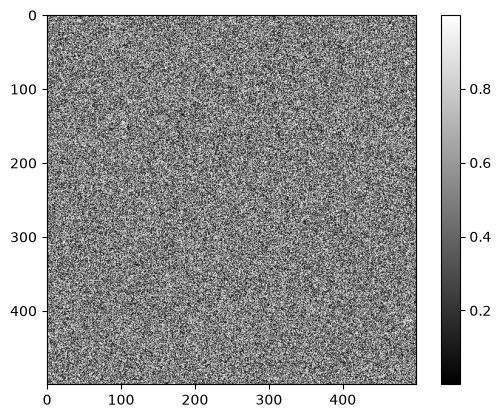

In [72]:
random_image = np.random.random([500, 500])
plt.imshow(random_image, cmap='gray')
plt.colorbar()


Type: <class 'numpy.ndarray'>
dtype: uint8
shape: (400, 600, 3)


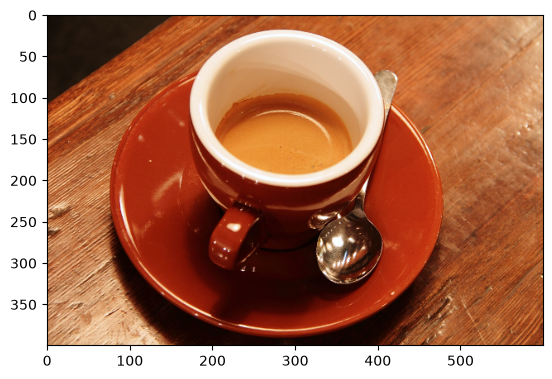

In [73]:
coffee = data.coffee()
print('Type:', type(coffee))

print('dtype:', coffee.dtype)

print('shape:', coffee.shape)

plt.imshow(coffee, cmap='gray')

Os métodos cat.min() e cat.max() retornam, respectivamente, o menor e o maior valor de intensidade de pixel presentes na matriz da imagem.

Shape: (300, 451, 3)
Values min/max: 0 231


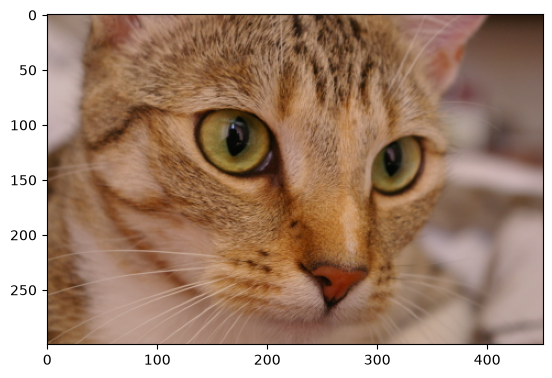

In [74]:
cat = data.chelsea()
print("Shape:", cat.shape)
print("Values min/max:", cat.min(), cat.max())

plt.imshow(cat)

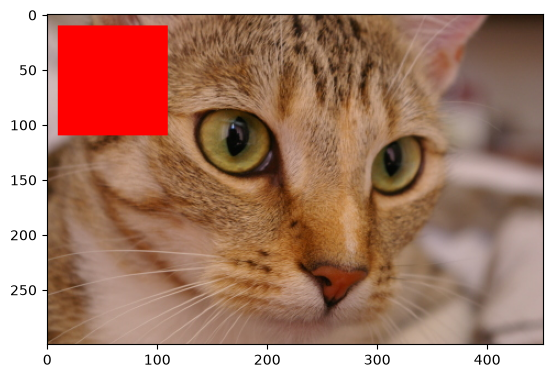

In [75]:
cat[10:110, 10:110, :] = [255, 0, 0]  # [red, green, blue]
plt.imshow(cat)

## **Imagem I/O**

Para carregar e exibir uma imagem de um diretorio usa-se o '
'from skimage import io'

<class 'numpy.ndarray'>
uint8
(184, 280, 3)
0 255


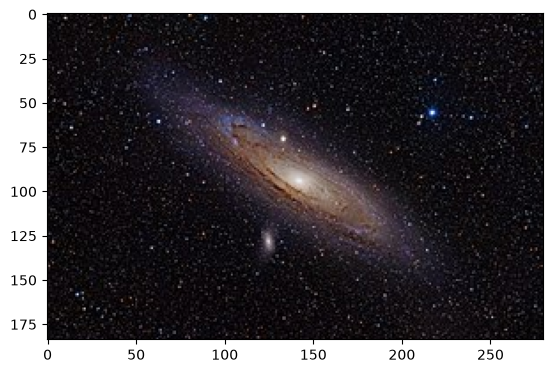

In [76]:
from skimage import io
image = io.imread("image/andromeda.jpg")

print(type(image))
print(image.dtype)
print(image.shape)
print(image.min(), image.max())
plt.imshow(image)

Para salvar (escrever) a imagem no disco utiliza-se a função skimage.io.imsave

In [77]:
io.imsave("image/andromeda_processada.jpg", image)

## **Redimensionamento**

O método principal é:
**transform.resize()**

É possível definir diretamente o tamanho desejado ou utilizar um fator de escala.

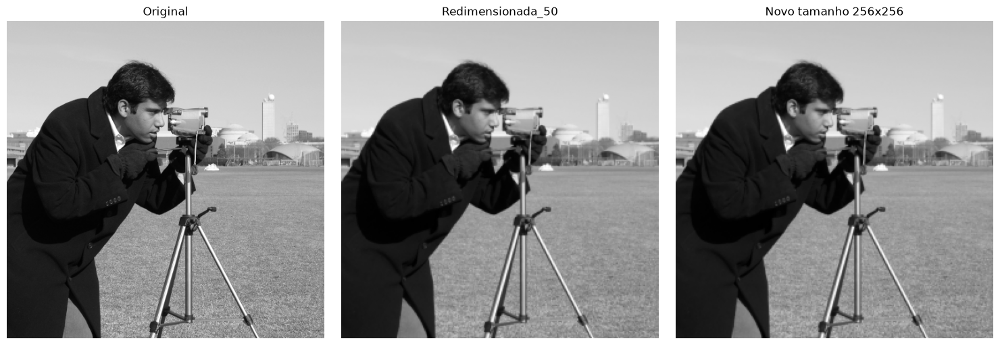

In [78]:
from skimage import transform

camera = data.camera()
redimensionada_50 = transform.rescale( camera,0.5,anti_aliasing=True)

redimensionada = transform.resize(camera,(256, 256),anti_aliasing=True) # o aliasing é o intepolation daqui

fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(15, 5))
ax0.imshow(camera, cmap='gray')
ax0.set_title('Original')
ax0.axis('off')

ax1.imshow(redimensionada_50, cmap='gray')
ax1.set_title('Redimensionada_50')
ax1.axis('off')

ax2.imshow(redimensionada, cmap='gray')
ax2.set_title('Novo tamanho 256x256')
ax2.axis('off')
plt.tight_layout()


1. rescale() trabalha com um **fator de escala**.
2. resize() permite especificar o **tamanho final**.
3. anti_aliasing=True reduz artefatos durante a redução da imagem.

## **Translação e Rotação**



### **Translação**

A translação desloca a imagem horizontalmente ou verticalmente. No scikit-image é possivel utilizar uma transformação afim com: transform.AffineTransform() e transform.warp()


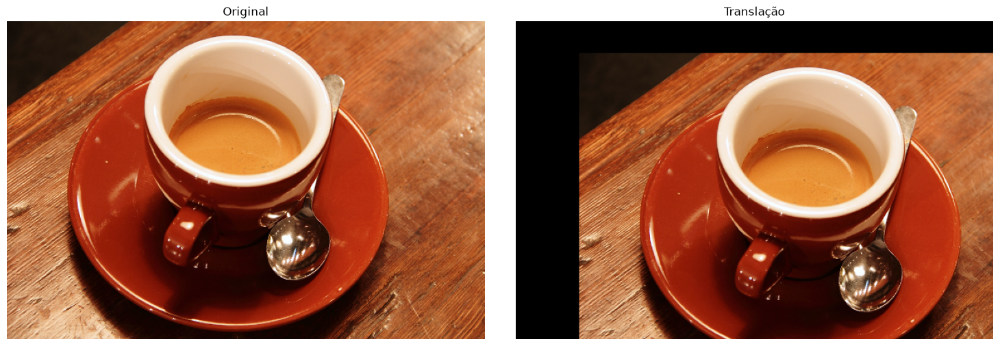

In [79]:
coffee = data.coffee()

t = transform.AffineTransform(translation=(80, 40))

translacao = transform.warp(coffee,t.inverse,preserve_range=True)
translacao = translacao.astype(np.uint8)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(15, 5))
ax0.imshow(coffee)
ax0.set_title('Original')
ax0.axis('off')

ax1.imshow(translacao)
ax1.set_title('Translação')
ax1.axis('off')
plt.tight_layout()

### **Rotação**

A rotação pode ser feita diretamente com o **transform.rotate()**. O ângulo é informado em graus.

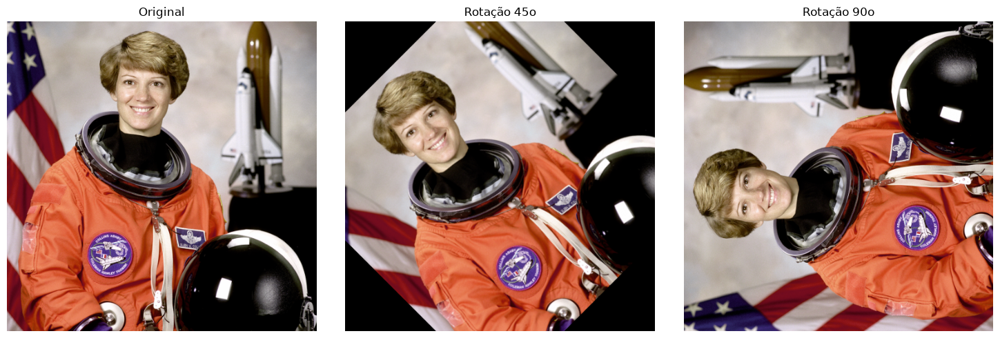

In [80]:
astronaut= data.astronaut()

rotaciona45 = transform.rotate(astronaut, angle=45, resize=False)
rotaciona90 = transform.rotate(astronaut, angle=90, resize=False)

fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(15,5))

ax0.imshow(astronaut)
ax0.set_title("Original")
ax0.axis('off')

ax1.imshow(rotaciona45)
ax1.set_title("Rotação 45o")
ax1.axis('off')
plt.tight_layout()

ax2.imshow(rotaciona90)
ax2.set_title("Rotação 90o")
ax2.axis('off')
plt.tight_layout()

## **Desenho e Marcação de imagens**

Para desenhar, criar formas e marcar regiões em uma imagem usa-se o módulo skimage.draw 

Ele possui várias formas sendo estas as mais importantes:
1. draw.line()
2. deaw.rectangle()
3. draw.disk()
4. draw.ellipse()


### **Desenhando uma linha**

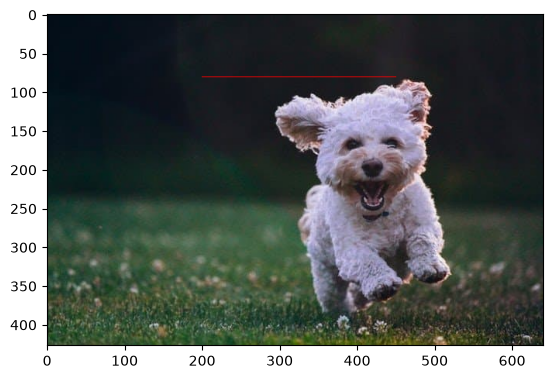

In [81]:
from skimage import draw, color

image = io.imread('image/cachorro.jpg')
desenho = image.copy()

#pointA = (200,80)
#pointB = (450,80)

#rr, cc = draw.line(r0, c0, r1, c1)

rr, cc = draw.line(80, 200, 80, 450)

desenho[rr, cc] = [255, 0, 0]

plt.imshow(desenho)

### **Desenhando  um Círculo**

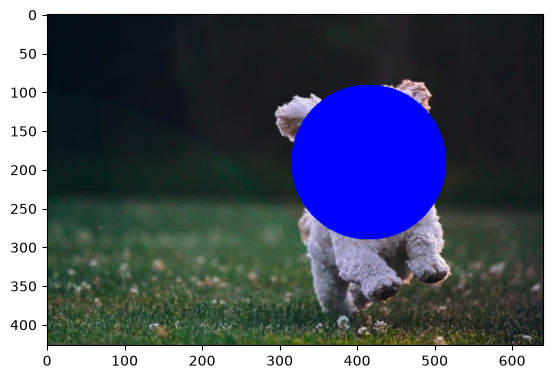

In [82]:
desenho2 = image.copy()
circle_center = (190, 415)
rr, cc = draw.disk(center=circle_center, radius=100, shape=desenho.shape)
#
desenho2[rr, cc] = [0, 0, 255]

plt.imshow(desenho2)

## **Filtragem de imagem**

### **Filtragem local** 

In [83]:
from skimage import filters

In [84]:
bright_square = np.zeros((7, 7), dtype=float) #cria uma matriz 7x7 de zeros
bright_square[2:5, 2:5] = 1 #preenche com 1 a fatia 

print(bright_square)

[[0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 1. 1. 0. 0.]
 [0. 0. 1. 1. 1. 0. 0.]
 [0. 0. 1. 1. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]


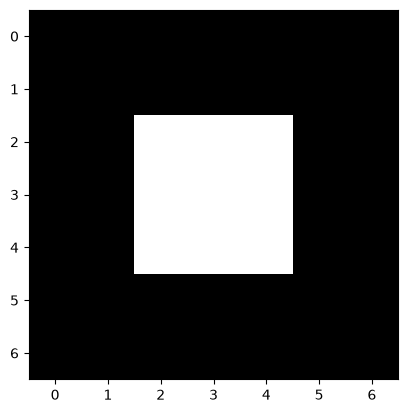

In [85]:
fig, ax = plt.subplots()
ax.imshow(bright_square, cmap='gray')

**Filtro da Média**

O experimento a seguir demonstra o processo de downsampling de uma imagem real para reduzir a sua resolução e tornar os efeitos de filtragens (a seguir) mais fáceis de observar.

O uso do passo [::10, ::10] descarta pixels brutos sem nenhum tratamento prévio, o que gera o efeito de aliasing (serrilhamento e perda abrupta de detalhes). Segundo o tutorial essa abordagem  serve apenas para o exemplo. Em aplicações e projetos reais, o redimensionamento pode ser feito atraves do skimage.transform.rescale ou skimage.transform.resize, que aplicam filtros anti-aliasing antes de reduzir o tamanho da imagem.


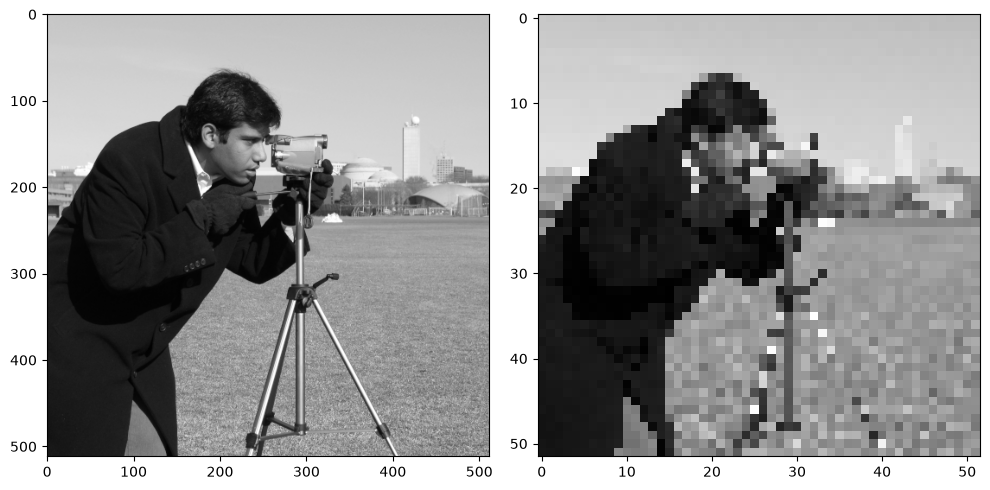

In [ ]:
image = data.camera()
pixelated = image[::10, ::10] 

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))
ax0.imshow(image, cmap="gray")
ax1.imshow(pixelated, cmap="gray")
plt.tight_layout()


In [87]:
import scipy.ndimage as ndi

mean_kernel = np.full((3, 3), 1/9) 
print(mean_kernel) 

[[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]


Ao deslizar o kernel acima (3x3) sobre a imagem pixelada por meio da função ndi.correlate, o algoritmo recalcula a intensidade de cada pixel fazendo a média aritmética entre ele e seus 8 vizinhos diretos. O resultado é a substituição dos blocos serrilhados por transições graduais gerando um efeito de desfocamento

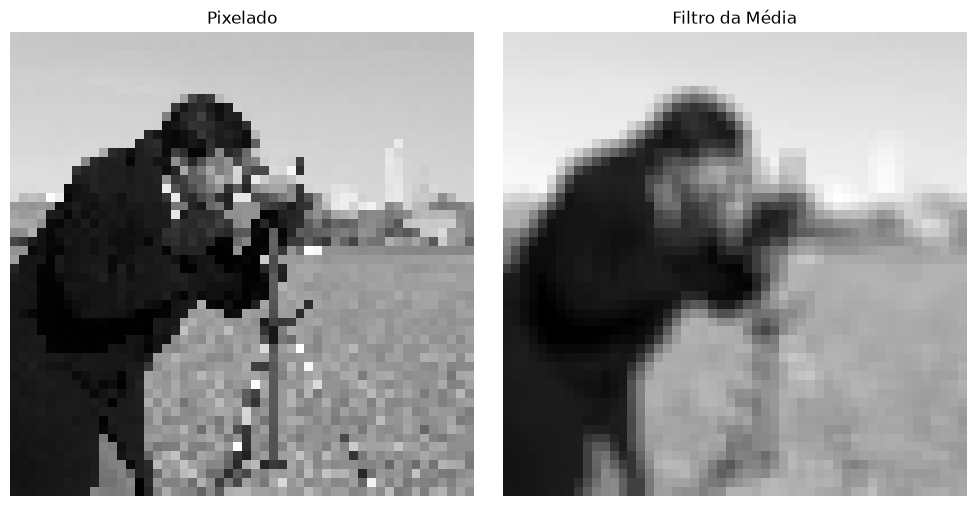

In [88]:
filtered = ndi.correlate(pixelated, mean_kernel)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))
ax0.imshow(pixelated, cmap="gray")
ax0.set_title('Pixelado')
ax0.axis('off')

ax1.imshow(filtered, cmap="gray")
ax1.set_title('Filtro da Média')
ax1.axis('off')
plt.tight_layout()

**Filtro Gaussiano**

O filtro gaussiano, diferentemente do filtro da média, não pesa todos os valores na vizinhança igualmente. Em vez disso, pixels mais próximos do centro são pesados mais do que aqueles mais distantes.

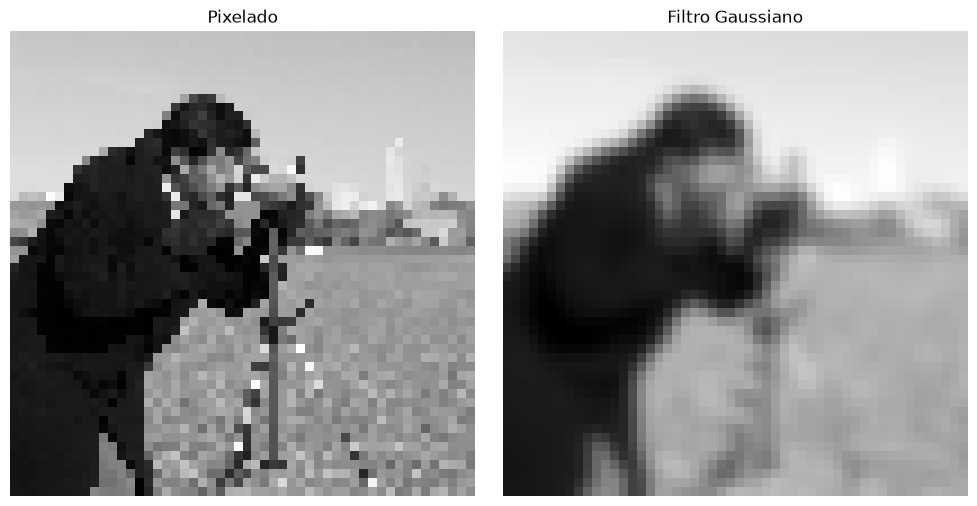

In [89]:
gaussian_b = filters.gaussian(pixelated, sigma=1)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))
ax0.imshow(pixelated, cmap="gray")
ax0.set_title('Pixelado')
ax0.axis('off')

ax1.imshow(gaussian_b, cmap="gray")
ax1.set_title('Filtro Gaussiano')
ax1.axis('off')
plt.tight_layout()

O filtro gaussiano é tipicamente preferido por causa da ponderação dependente da distância e porque não tem nenhuma transição nítida

### **Filtragem de borda**

**Sobel**

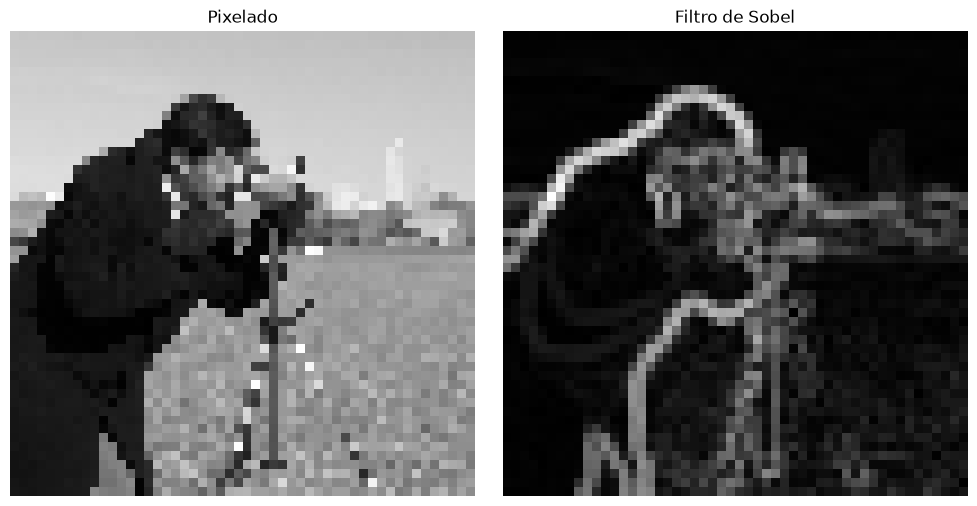

In [90]:
pixelated_gradient = filters.sobel(pixelated)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))
ax0.imshow(pixelated, cmap="gray")
ax0.set_title('Pixelado')
ax0.axis('off')

ax1.imshow(pixelated_gradient, cmap="gray")
ax1.set_title('Filtro de Sobel')
ax1.axis('off')

plt.tight_layout()

### **Filtros de denoising**

**Filtro Mediano**

O filtro mediano substitui cada pixel pelo valor central (mediana) de sua vizinhança após ordenar os valores do menor para o maior.

Filtro de Média: Ao encontrar uma borda (transição entre preto 0 e branco 255), a média calcula o valor intermediário e gera tons de cinza (128). Isso destrói o contorno e deixa a imagem borrada (blur).

Filtro Mediano: Ao ordenar os valores do bairro, a mediana é forçada a escolher um tom que já é dominante naquela região (ou 0 ou 255). A transição continua afiada e nítida.


No experimento abaixo, mostrado no tutorial, é utilizado um elemento estruturante circular de raio 10 (disk(10)) para comparar os efeitos das funções rank.mean e rank.median sobre a imagem.

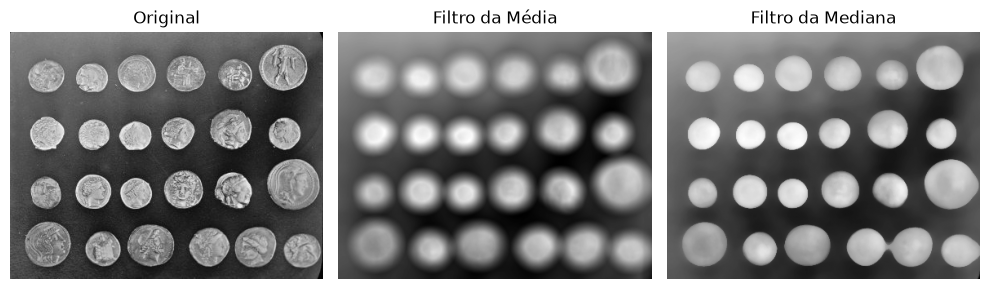

In [91]:
from skimage.morphology import disk

neighborhood = disk(10)

coins = data.coins()

mean_coin = filters.rank.mean(coins, neighborhood)
median_coin = filters.rank.median(coins, neighborhood)

fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(10, 5))
ax0.imshow(coins, cmap="gray")
ax0.set_title('Original')
ax0.axis('off')

ax1.imshow(mean_coin, cmap="gray")
ax1.set_title('Filtro da Média')
ax1.axis('off')

ax2.imshow(median_coin, cmap="gray")
ax2.set_title('Filtro da Mediana')
ax2.axis('off')

plt.tight_layout()

## **Limiar de uma imagem**

No scikit-image é possivel aplicar a binarização por meio do módulo skimage.filters

Não existe uma função específica como cv2.threshold para um limiar fixo, no scikit-image isso é feito diretamente usando expressões lógicas do NumPy.

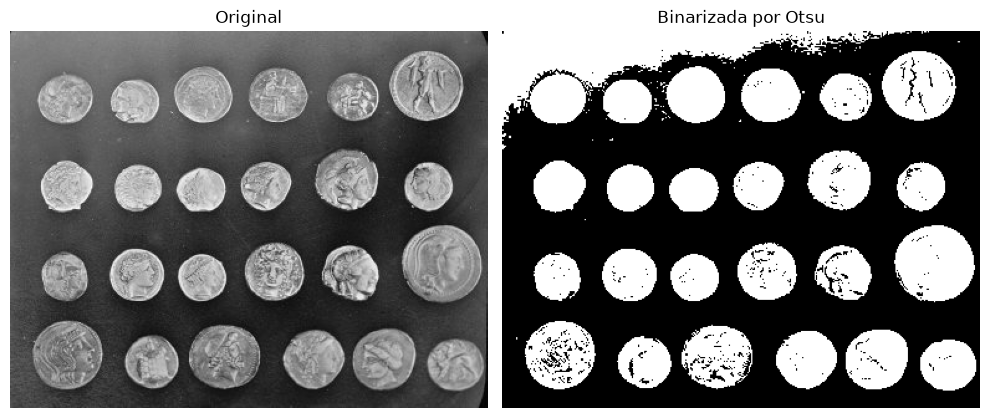

In [92]:
coins = data.coins()

thr_otsu = filters.threshold_otsu(coins) #calcula o valor do limiar

coins_bin= coins > thr_otsu # essa comparação cria a imagem binaria

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))

ax0.imshow(coins, cmap="gray")
ax0.set_title("Original")
ax0.axis('off')

ax1.imshow(coins_bin, cmap="gray")
ax1.set_title("Binarizada por Otsu")
ax1.axis('off')

plt.tight_layout()


No experimento abaiixo é possivel observar a Limiarização por Otsu e a Local. O método filters.threshold_local calcula uma matriz de limiares adaptativos individualmente para cada pixel da imagem utilizando uma janela de 7x7 pixels ao redor de cada ponto e o offset=10 como um valor constante subtraído da média dessa janela para evitar que pequenos ruídos do fundo sejam binarizados

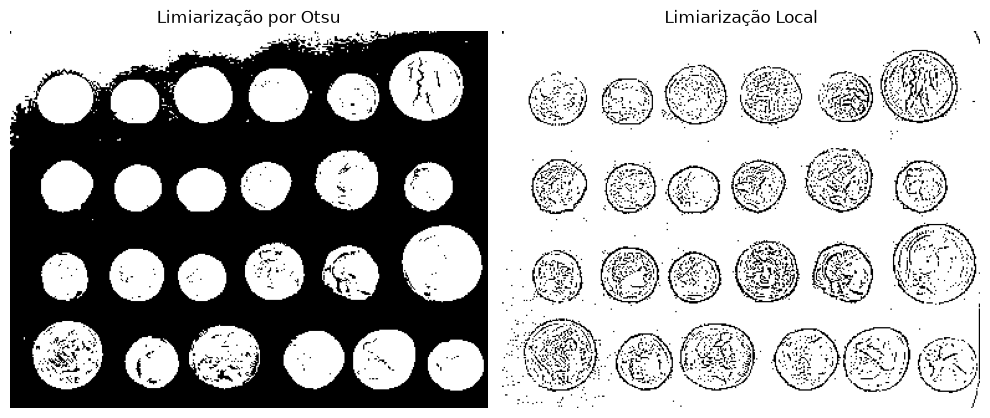

In [93]:
thr_local = filters.threshold_local(coins, block_size=7, offset=10)

bin_local = coins > thr_local


fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))

ax0.imshow(coins_bin, cmap="gray")
ax0.set_title("Limiarização por Otsu")
ax0.axis('off')

ax1.imshow(bin_local, cmap="gray")
ax1.set_title("Limiarização Local")
ax1.axis('off')

plt.tight_layout()



## **Detecção de Contornos**

In [94]:
from skimage.color import rgb2gray

image20 = io.imread('image/hierarquia.jpg')



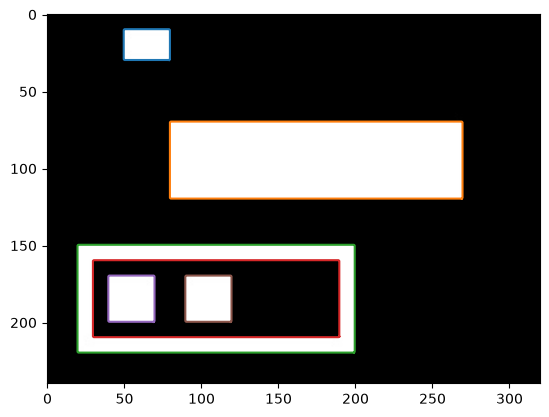

In [95]:
from skimage import measure

contours = measure.find_contours(image20, 127)

for contour in contours:
    plt.plot(contour[:, 1], contour[:, 0])

#plt.imshow(contours)
plt.imshow(image20, cmap='gray')
plt.show()

## **Operações morfológicas**

**Dilatação**

In [96]:
from skimage import morphology, color

In [97]:
image = io.imread("image/opencv.png")
print(image.shape)
print(image.dtype)

image_rgb = image[:, :, :3]

(307, 307, 4)
uint8


(np.float64(-0.5), np.float64(306.5), np.float64(306.5), np.float64(-0.5))

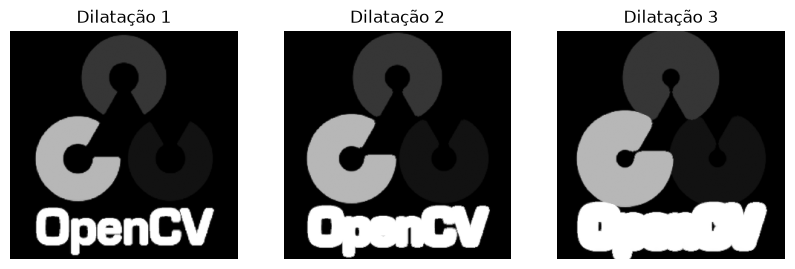

In [98]:

image = color.rgb2gray(image_rgb)

selem1 = morphology.disk(2)
dilated1 = morphology.dilation(image, selem1)

selem2 = morphology.disk(5)
dilated2 = morphology.dilation(image, selem2)

selem3 = morphology.disk(10)
dilated3 = morphology.dilation(image, selem3)

fig, (ax0, ax1, ax2)= plt.subplots(1,3, figsize=(10, 5))

ax0.imshow(dilated1, cmap='gray')
ax0.set_title('Dilatação 1')
ax0.axis('off')

ax1.imshow(dilated2, cmap='gray')
ax1.set_title('Dilatação 2')
ax1.axis('off')

ax2.imshow(dilated3, cmap='gray')
ax2.set_title('Dilatação 3')
ax2.axis('off')

**Erosão**

(np.float64(-0.5), np.float64(306.5), np.float64(306.5), np.float64(-0.5))

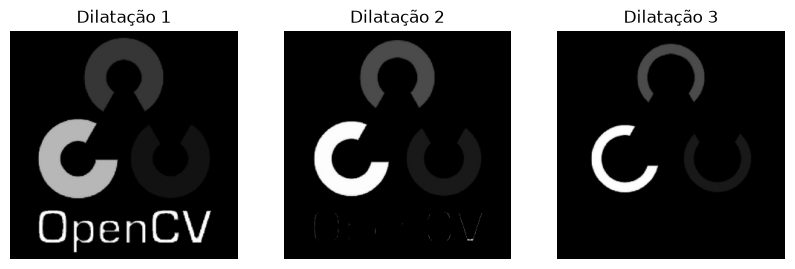

In [99]:
image = color.rgb2gray(image_rgb)

selem1 = morphology.disk(2)
eroded1 = morphology.erosion(image, selem1)

selem2 = morphology.disk(5)
eroded2 = morphology.erosion(image, selem2)

selem3 = morphology.disk(10)
eroded3 = morphology.erosion(image, selem3)

fig, (ax0, ax1, ax2)= plt.subplots(1,3, figsize=(10, 5))

ax0.imshow(eroded1, cmap='gray')
ax0.set_title('Dilatação 1')
ax0.axis('off')

ax1.imshow(eroded2, cmap='gray')
ax1.set_title('Dilatação 2')
ax1.axis('off')

ax2.imshow(eroded3, cmap='gray')
ax2.set_title('Dilatação 3')
ax2.axis('off')

**Abertura e Fechamento**

(np.float64(-0.5), np.float64(306.5), np.float64(306.5), np.float64(-0.5))

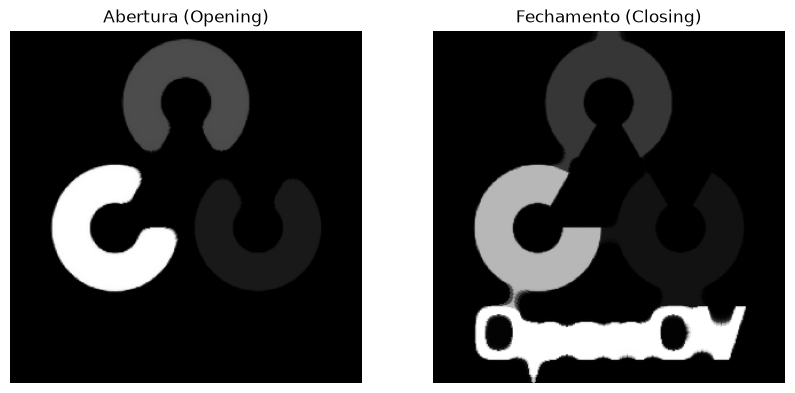

In [100]:
opening = morphology.opening(image, selem3)

closing = morphology.closing(image, selem3)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 5))

ax0.imshow(opening, cmap='gray')
ax0.set_title('Abertura (Opening)')
ax0.axis('off')

ax1.imshow(closing, cmap='gray')
ax1.set_title('Fechamento (Closing)')
ax1.axis('off')


Com a abertura: objetos grandes permanecem relativamente preservados, enquanto pequenas regiões claras podem desaparecer.

Com o fechamento: pequenos espaços escuros dentro dos objetos claros podem ser preenchidos.